##**MelanoAI Skin Cancer Detection**

**Problem Statement**


**Developing an accurate and accessible system for skin cancer detection is critical to improving early diagnosis and treatment outcomes. Melano AI aims to bridge the gap in dermatological expertise and diagnostic capabilities by providing a reliable, AI-driven solution for classifying skin lesions as benign or malignant, ensuring equitable access to life-saving technology across diverse regions.**

**Objective:**

**To Build an Artificial Intelligence model to accurately classify skin lesions as benign or malignant, and provide a user-friendly interface for interaction.**

**Importing Libraries**

In [ ]:
import os
import zipfile
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import cv2
from glob import glob
import numpy as np
import pandas as pd
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import imageio
from PIL import Image
import hashlib
import shutil
import imageio.v2 as imageio
import matplotlib.patches as patches

**Extracting the content from Zipfile**

In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/archive (1).zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

**Loading the Dataset**

In [ ]:
train_dir = '/content/melanoma_cancer_dataset/train'
test_dir ='/content/melanoma_cancer_dataset/test'

train_benign = glob(train_dir+'/benign/*')
train_malignant = glob(train_dir+'/malignant/*')

test_benign = glob(test_dir+'/benign/*')
test_malignant = glob(test_dir+'/malignant/*')

In [ ]:
extracted_folder = '/content/melanoma_cancer_dataset'
# Initialize a list to hold the directory contents
directory_contents = []

# Get the contents of the main dataset folder
main_contents = os.listdir(extracted_folder)
directory_contents.append({'Directory': 'Dataset', 'Contents': main_contents})

# List the contents of ('train' and 'test') directories
for item in main_contents:
    item_path = os.path.join(extracted_folder, item)
    if os.path.isdir(item_path):
        # Collect the immediate subdirectory names
        sub_contents = os.listdir(item_path)
        directory_contents.append({'Directory': item, 'Contents': sub_contents})

# Create a DataFrame to store the contents
df_contents = pd.DataFrame(directory_contents)

In [ ]:
df_contents

,Directory,Contents
0,Dataset,"[test, train]"
1,test,"[benign, malignant]"
2,train,"[benign, malignant]"


**Displaying Number of Benign and Malignant images**

In [ ]:
print('Number of Benign Images in trained dataset:' ,len(train_benign))
print('Number of Maligant Images in trained dataset:' ,len(train_malignant))
print('Number of Benign Images in testing dataset:', len(test_benign))
print('Number of Maligant Images in testing dataset:',len(test_malignant))

Number of Benign Images in trained dataset: 5000
Number of Maligant Images in trained dataset: 4605
Number of Benign Images in testing dataset: 500
Number of Maligant Images in testing dataset: 500


**Displaying a few sample images from the dataset**

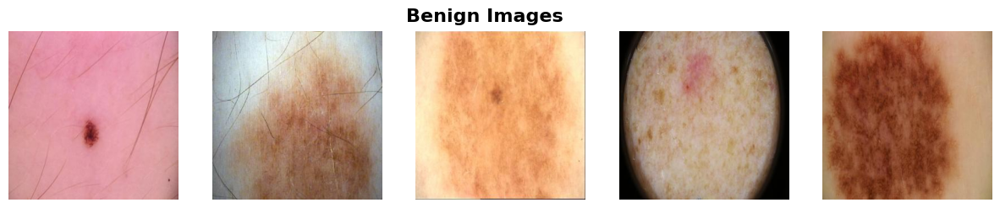

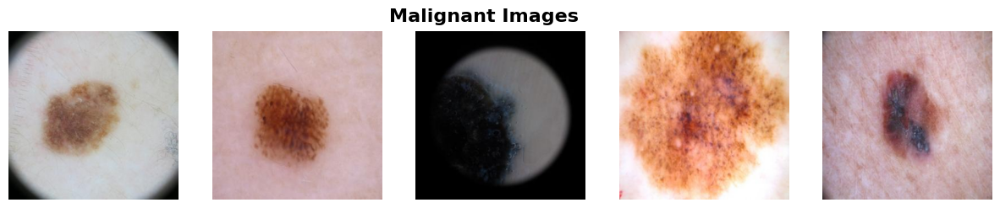

In [ ]:
def show_samples(image_list,title,num_samples = 5):
  plt.figure(figsize=(15,5))
  for i in range(num_samples):
    img = Image.open(image_list[i])
    plt.subplot(1,num_samples,i+1)
    plt.imshow(img)
    plt.axis('off')
  plt.suptitle(title,fontsize=16,weight='bold',y=0.75)
  plt.show()

show_samples(train_benign,'Benign Images',num_samples=5)
show_samples(train_malignant,'Malignant Images',num_samples=5)

**Checking class imbalance using pie chart before removing duplicate images**

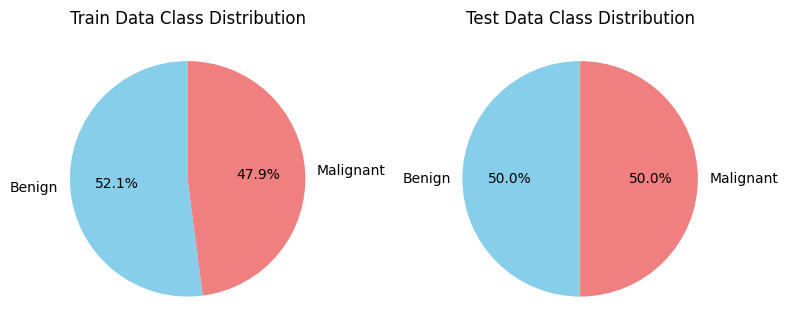

In [ ]:
# Data for the pie charts
train_data = [len(train_benign), len(train_malignant)]
test_data = [len(test_benign), len(test_malignant)]
labels = ['Benign', 'Malignant']
colors = ['skyblue', 'lightcoral']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Train data pie chart
axes[0].pie(train_data, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
axes[0].set_title('Train Data Class Distribution')

# Test data pie chart
axes[1].pie(test_data, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
axes[1].set_title('Test Data Class Distribution')

plt.tight_layout()
plt.show()

Train data of Malignant is 4.2% lesser than Benign,thus there is slight imbalance of data between two classes.

There is no imbalance in the test dataset between Bengin and Malignant

**Checking Class Imbalance using Bar chart**

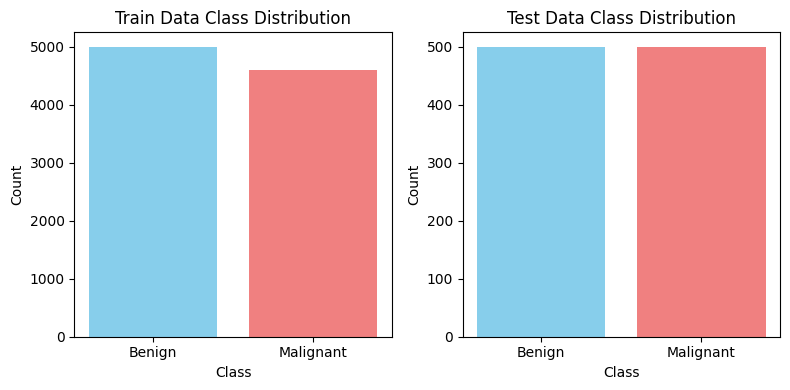

In [ ]:
train_data = [len(train_benign), len(train_malignant)]
test_data = [len(test_benign), len(test_malignant)]
labels = ['Benign', 'Malignant']
colors = ['skyblue', 'lightcoral']

fig, axes = plt.subplots(1, 2, figsize=(8, 4))

axes[0].bar(labels, train_data, color=colors)
axes[0].set_title('Train Data Class Distribution')
axes[0].set_xlabel('Class')
axes[0].set_ylabel('Count')

axes[1].bar(labels, test_data, color=colors)
axes[1].set_title('Test Data Class Distribution')
axes[1].set_xlabel('Class')
axes[1].set_ylabel('Count')

# Adjust layout and display
plt.tight_layout()
plt.show()

**Identifying Duplicate Images**

In [ ]:
!pip install imagehash
import imagehash
from PIL import Image
import os
def find_and_remove_duplicates(image_dir,remove=False):
  image_hashes = {}
  duplicates = []
  if not os.path.isdir(image_dir):
    print(f"Directory does not exist: {image_dir}")
    return duplicates
  for filename in os.listdir(image_dir):
    # Call lower() method to convert filename to lowercase before using endswith
    if filename.lower().endswith(('.png','.jpg','.jpeg')):
      img_path = os.path.join(image_dir,filename)
      try:
        with Image.open(img_path) as img:
          hash=imagehash.phash(img)
          if hash in image_hashes:
            duplicates.append((image_hashes[hash],img_path))
            if remove:
              os.remove(img_path)
              print(f"Duplicate image removed: {img_path}")
          else:
            image_hashes[hash] = img_path
      except Exception as e:
        print(f"Error processing {img_path},error: {e}")
  return duplicates

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 89.2 MB/s eta 0:00:00


In [ ]:
train_benign_path ='/content/melanoma_cancer_dataset/train/benign'
train_malignant_path ='/content/melanoma_cancer_dataset/train/malignant'
test_benign_path ='/content/melanoma_cancer_dataset/test/benign'
test_malignant_path ='/content/melanoma_cancer_dataset/test/malignant'

# Initialize variables to store duplicate results
train_benign_duplicates = []
train_malignant_duplicates = []
test_benign_duplicates = []
test_malignant_duplicates = []


datasets=[
        (train_benign_path,train_benign_duplicates),
        (train_malignant_path,train_malignant_duplicates),
        (test_benign_path,test_benign_duplicates),
        (test_malignant_path,test_malignant_duplicates)
    ]
for dataset_path,dataset_name in datasets:
      duplicates = find_and_remove_duplicates(dataset_path,remove=True)
      # Store the results from `find_and_remove_duplicates`
      dataset_name.extend(duplicates)
      duplicate_count = len(duplicates)
      print(f"Found {len(duplicates)} duplicates in {dataset_path}")

Duplicate image removed: /content/melanoma_cancer_dataset/train/benign/melanoma_2409.jpg
Duplicate image removed: /content/melanoma_cancer_dataset/train/benign/melanoma_297.jpg
Duplicate image removed: /content/melanoma_cancer_dataset/train/benign/melanoma_655.jpg
Duplicate image removed: /content/melanoma_cancer_dataset/train/benign/melanoma_2703.jpg
Duplicate image removed: /content/melanoma_cancer_dataset/train/benign/melanoma_1800.jpg
Duplicate image removed: /content/melanoma_cancer_dataset/train/benign/melanoma_1998.jpg
Duplicate image removed: /content/melanoma_cancer_dataset/train/benign/melanoma_1110.jpg
Duplicate image removed: /content/melanoma_cancer_dataset/train/benign/melanoma_4549.jpg
Found 8 duplicates in /content/melanoma_cancer_dataset/train/benign
Duplicate image removed: /content/melanoma_cancer_dataset/train/malignant/melanoma_5657.jpg
Duplicate image removed: /content/melanoma_cancer_dataset/train/malignant/melanoma_8379.jpg
Duplicate image removed: /content/mela

It is observed that there are some duplicate images in train benign,malignant and test benign

**Reporting the Count of Duplicate Images**

In [ ]:
print("Duplicates count in train dataset")
print(f"Train Benign Duplicates: {len(train_benign_duplicates)}")
print(f"Train Malignant Duplicates: {len(train_malignant_duplicates)}")
print(" ")
print("Duplicates count in test dataset")
print(f"Test Benign Duplicates: {len(test_benign_duplicates)}")
print(f"Test Malignant Duplicates: {len(test_malignant_duplicates)}")
print(" ")
total_duplicates = len(train_benign_duplicates) + len(train_malignant_duplicates) + len(test_benign_duplicates) + len(test_malignant_duplicates)
print(f"Total Number of duplicate images: {total_duplicates}")

Duplicates count in train dataset
Train Benign Duplicates: 8
Train Malignant Duplicates: 18
 
Duplicates count in test dataset
Test Benign Duplicates: 1
Test Malignant Duplicates: 0
 
Total Number of duplicate images: 27


The presence of duplicate images in both the training and test datasets could potentially bias the model’s learning and evaluation.

**Creating Directories for Unique Image Datasets**

In [ ]:
unique_train_dir = "/content/melanoma_cancer_dataset/train_unique"
unique_test_dir = "/content/melanoma_cancer_dataset/test_unique"

os.makedirs(unique_train_dir+ '/benign',exist_ok=True)
os.makedirs(unique_train_dir+ '/malignant',exist_ok=True)
os.makedirs(unique_test_dir+ '/benign',exist_ok=True)
os.makedirs(unique_test_dir+ '/malignant',exist_ok=True)

**Moving Unique Images to Designated Directories**

In [ ]:
import os
import shutil
import hashlib

def calculate_hash(image_path):

    hasher = hashlib.sha256()
    with open(image_path, 'rb') as file:
        while True:
            chunk = file.read(4096)
            if not chunk:
                break
            hasher.update(chunk)
    return hasher.hexdigest()


def move_unique_images(image_list, destination_dir):

    hash_dict = {}
    for image_path in image_list:
        # Check if it's a file before calculating hash
        if os.path.isfile(image_path):
            image_hash = calculate_hash(image_path)
            if image_hash not in hash_dict:
                hash_dict[image_hash] = image_path
                filename = os.path.basename(image_path)
                shutil.copy2(image_path, os.path.join(destination_dir, filename))

# Move unique training images
move_unique_images(train_benign, unique_train_dir + '/benign')
move_unique_images(train_malignant, unique_train_dir + '/malignant')

# Move unique testing images
move_unique_images(test_benign, unique_test_dir + '/benign')
move_unique_images(test_malignant, unique_test_dir + '/malignant')

print("Unique images moved successfully.")

Unique images moved successfully.


**Counting Unique Images in the Dataset**

In [ ]:
unique_train_benign = glob(unique_train_dir+'/benign/*')
unique_train_malignant = glob(unique_train_dir+'/malignant/*')

unique_test_benign = glob(unique_test_dir+'/benign/*')
unique_test_malignant = glob(unique_test_dir+'/malignant/*')
print('Number of Unique Benign Images in trained dataset:' ,len(unique_train_benign))
print('Number of Unique Maligant Images in trained dataset:' ,len(unique_train_malignant))
print('Number of Unique Benign Images in testing dataset:', len(unique_test_benign))
print('Number of Unique Maligant Images in testing dataset:',len(unique_test_malignant))

Number of Unique Benign Images in trained dataset: 4992
Number of Unique Maligant Images in trained dataset: 4587
Number of Unique Benign Images in testing dataset: 499
Number of Unique Maligant Images in testing dataset: 500


**Visualizing Image Distribution in the Unique Training Dataset**

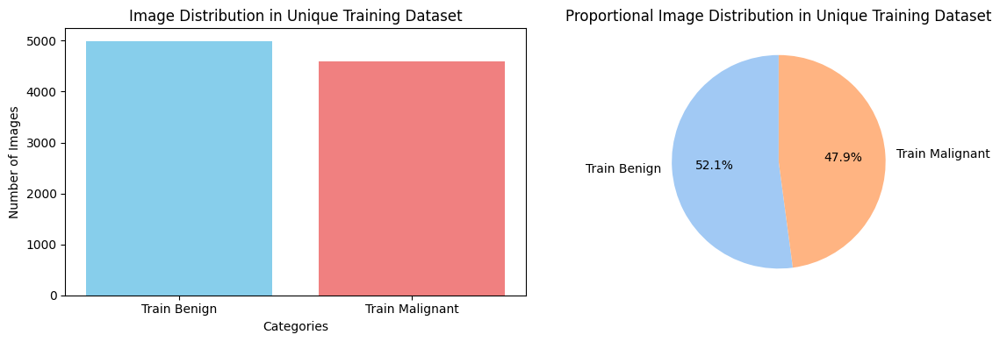

In [ ]:
def plot_image_distribution_train():
  labels = ['Train Benign','Train Malignant']
  counts = [len(unique_train_benign),len(unique_train_malignant)]
  colors = ['skyblue', 'lightcoral']

  plt.figure(figsize=(12, 4))
  plt.subplot(1,2,1)
  plt.bar(labels,counts,color=colors)
  #sns.barplot(x=labels,y=counts)
  plt.title('Image Distribution in Unique Training Dataset')
  plt.xlabel('Categories')
  plt.ylabel('Number of Images')

  plt.subplot(1,2,2)
  plt.pie(counts,labels=labels,autopct='%1.1f%%',startangle=90,colors=sns.color_palette('pastel'))
  plt.title('Proportional Image Distribution in Unique Training Dataset')

  plt.tight_layout()
  plt.show()

plot_image_distribution_train()

**Visualizing Image Distribution in the Unique Test Dataset**

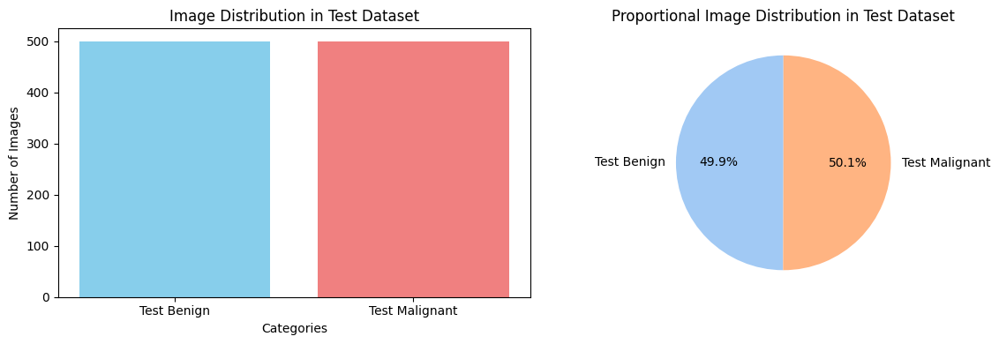

In [ ]:
def plot_image_distribution_test():
  labels = ['Test Benign','Test Malignant']
  counts = [len(unique_test_benign),len(unique_test_malignant)]
  colors = ['skyblue', 'lightcoral']
  plt.figure(figsize=(12, 4))
  plt.subplot(1,2,1)
  plt.bar(labels,counts,color=colors)
  #sns.barplot(x=labels,y=counts)
  plt.title('Image Distribution in Test Dataset')
  plt.xlabel('Categories')
  plt.ylabel('Number of Images')

  plt.subplot(1,2,2)
  plt.pie(counts,labels=labels,autopct='%1.1f%%',startangle=90,colors=sns.color_palette('pastel'))
  plt.title('Proportional Image Distribution in Test Dataset')

  plt.tight_layout()
  plt.show()

plot_image_distribution_test()

**Displaying the size of few images**

In [ ]:
def get_image_shapes(image_paths, num_samples=4): # Change 'image_dir' to 'image_paths'

  for img_path in image_paths[:num_samples]:
    img = Image.open(img_path)
    print(f"Image Shape (width x Height): {img.size}")

print("Benign Image Shapes:")
get_image_shapes(train_benign) # Call the function with the list of image paths
print("Malignant Image Shapes:")
get_image_shapes(train_malignant) # Call the function with the list of image paths

Benign Image Shapes:
Image Shape (width x Height): (300, 300)
Image Shape (width x Height): (300, 300)
Image Shape (width x Height): (300, 300)
Image Shape (width x Height): (300, 300)
Malignant Image Shapes:
Image Shape (width x Height): (300, 300)
Image Shape (width x Height): (300, 300)
Image Shape (width x Height): (300, 300)
Image Shape (width x Height): (300, 300)


From the output we can Infer that Shape analysis is uniform across both classes.

**Heatmap for the image shape and size in train dataset**

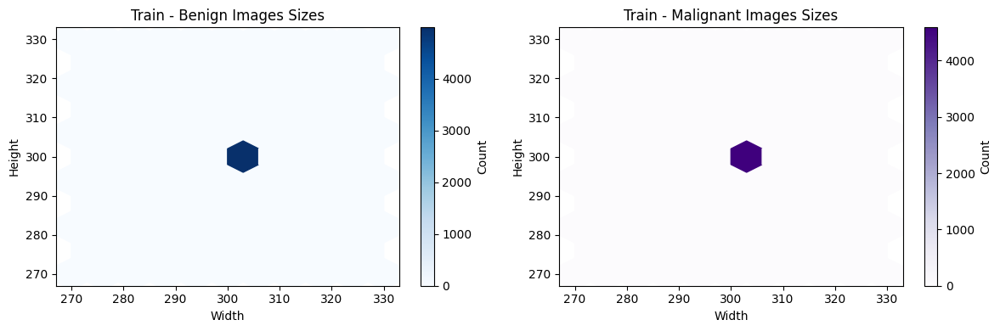

In [ ]:
def plot_image_heatmap_train_side_by_side(train_benign_paths, train_malignant_paths):
  benign_sizes = [Image.open(img_path).size for img_path in train_benign_paths
                  if img_path.endswith(('.jpg', '.png', '.jpeg')) and os.path.exists(img_path)]
  benign_widths, benign_heights = zip(*benign_sizes)

  malignant_sizes = [Image.open(img_path).size for img_path in train_malignant_paths
                    if img_path.endswith(('.jpg', '.png', '.jpeg')) and os.path.exists(img_path)]
  malignant_widths, malignant_heights = zip(*malignant_sizes)

  fig, axs = plt.subplots(1, 2, figsize=(12, 4))

  # Benign Heatmap
  hexbin1 = axs[0].hexbin(benign_widths, benign_heights, gridsize=10, cmap='Blues')
  axs[0].set_title('Train - Benign Images Sizes')
  axs[0].set_xlabel('Width')
  axs[0].set_ylabel('Height')
  cbar1 = fig.colorbar(hexbin1, ax=axs[0], orientation='vertical')
  cbar1.set_label('Count')

  # Malignant Heatmap
  hexbin2 = axs[1].hexbin(malignant_widths, malignant_heights, gridsize=10, cmap='Purples')
  axs[1].set_title('Train - Malignant Images Sizes')
  axs[1].set_xlabel('Width')
  axs[1].set_ylabel('Height')
  cbar2 = fig.colorbar(hexbin2, ax=axs[1], orientation='vertical')
  cbar2.set_label('Count')

  plt.tight_layout()
  plt.show()

# Assuming 'train_benign' and 'train_malignant' are lists of image paths
plot_image_heatmap_train_side_by_side(train_benign, train_malignant) # Call function with the lists of image paths

Since both the classes have same shape and size thus we see similary consistency of heatmap in both the plots.

**Exploring Resolution and Aspect Ratio Distributions in Benign and Malignant Images**

Benign Image Analysis:
        Width  Height  Aspect Ratio
count  4992.0  4992.0        4992.0
mean    300.0   300.0           1.0
std       0.0     0.0           0.0
min     300.0   300.0           1.0
25%     300.0   300.0           1.0
50%     300.0   300.0           1.0
75%     300.0   300.0           1.0
max     300.0   300.0           1.0

Malignant Image Analysis:
        Width  Height  Aspect Ratio
count  4587.0  4587.0        4587.0
mean    300.0   300.0           1.0
std       0.0     0.0           0.0
min     300.0   300.0           1.0
25%     300.0   300.0           1.0
50%     300.0   300.0           1.0
75%     300.0   300.0           1.0
max     300.0   300.0           1.0


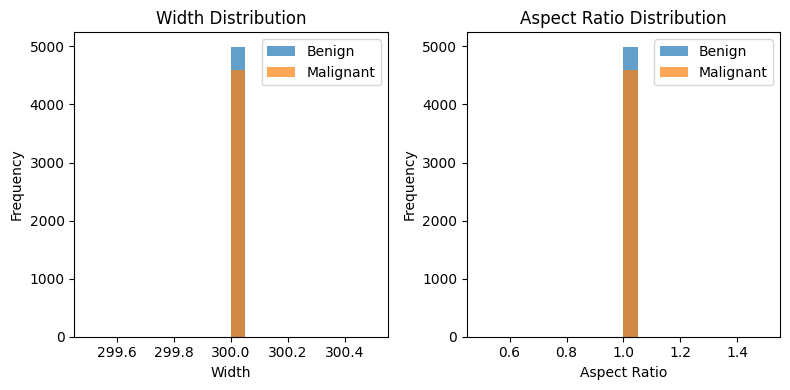

In [ ]:
def analyze_image_resolution(image_paths):

    data = []
    for image_path in image_paths: # Iterate directly through the image paths
        if image_path.endswith(('.jpg', '.png', '.jpeg')):  # Filter for image files
            # image_path is already the full path, no need to join

            # Check if file exists before attempting to open
            if os.path.exists(image_path):
                img = Image.open(image_path)
                width, height = img.size
                aspect_ratio = width / height
                data.append([image_path, width, height, aspect_ratio])
            else:
                print(f"Warning: File not found: {image_path}")  # Print a warning for missing files

    df = pd.DataFrame(data, columns=['Image Path', 'Width', 'Height', 'Aspect Ratio'])
    return df

# Assuming 'train_benign' and 'train_malignant' are lists of image paths
benign_df = analyze_image_resolution(unique_train_benign)
malignant_df = analyze_image_resolution(unique_train_malignant)

# You can now use the DataFrames to analyze resolutions and aspect ratios:
print("Benign Image Analysis:")
print(benign_df.describe())

print("\nMalignant Image Analysis:")
print(malignant_df.describe())

plt.figure(figsize=(8,4))

plt.subplot(1, 2, 1)
plt.hist(benign_df['Width'], bins=20, alpha=0.7, label='Benign')
plt.hist(malignant_df['Width'], bins=20, alpha=0.7, label='Malignant')
plt.xlabel("Width")
plt.ylabel("Frequency")
plt.title("Width Distribution")
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(benign_df['Aspect Ratio'], bins=20, alpha=0.7, label='Benign')
plt.hist(malignant_df['Aspect Ratio'], bins=20, alpha=0.7, label='Malignant')
plt.xlabel("Aspect Ratio")
plt.ylabel("Frequency")
plt.title("Aspect Ratio Distribution")
plt.legend()

plt.tight_layout()
plt.show()

The analysis of image resolutions (width) and aspect ratios highlights differences between the benign and malignant image datasets.

Variations in width or aspect ratio distributions could suggest a need for resizing or normalization during preprocessing to ensure model consistency.

**Color Channel Distribution of Images**

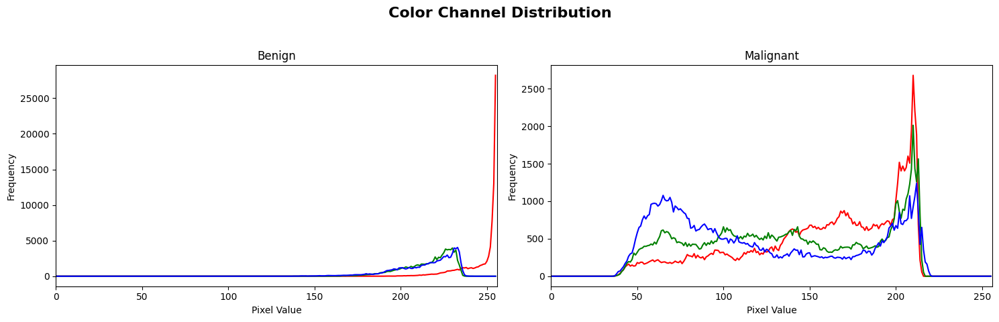

In [ ]:
unique_train_benign = glob(unique_train_dir+'/benign/*')
unique_train_malignant = glob(unique_train_dir+'/malignant/*')

unique_test_benign = glob(unique_test_dir+'/benign/*')
unique_test_malignant = glob(unique_test_dir+'/malignant/*')
def plot_color_histograms_side_by_side(benign_paths, malignant_paths, num_images=1):
    for i in range(num_images):
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # Adjust figure size
        fig.suptitle(f"Color Channel Distribution", fontsize=16, weight='bold')

        # Plot for benign image
        benign_image = cv2.imread(benign_paths[i])
        if benign_image is not None:
          benign_image = cv2.cvtColor(benign_image, cv2.COLOR_BGR2RGB)
          colors = ('r', 'g', 'b')
          for j, color in enumerate(colors):
              hist = cv2.calcHist([benign_image], [j], None, [256], [0, 256])
              axes[0].plot(hist, color=color)
              axes[0].set_xlim([0, 256])
          axes[0].set_title("Benign")
          axes[0].set_xlabel("Pixel Value")
          axes[0].set_ylabel("Frequency")
        else:
          print(f"Could not read image: {benign_paths[i]}")

        # Plot for malignant image
        malignant_image = cv2.imread(malignant_paths[i])
        if malignant_image is not None:
          malignant_image = cv2.cvtColor(malignant_image, cv2.COLOR_BGR2RGB)
          colors = ('r', 'g', 'b')
          for j, color in enumerate(colors):
              hist = cv2.calcHist([malignant_image], [j], None, [256], [0, 256])
              axes[1].plot(hist, color=color)
              axes[1].set_xlim([0, 256])
          axes[1].set_title("Malignant")
          axes[1].set_xlabel("Pixel Value")
          axes[1].set_ylabel("Frequency")
        else:
          print(f"Could not read image: {malignant_paths[i]}")

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout
        plt.show()

plot_color_histograms_side_by_side(unique_train_benign, unique_train_malignant, num_images=1)

 From analysis of color channel distribution of Benign and Maligant classes red as higher intensity compared to other colors.

**Comparative Analysis of Brightness and Contrast in Benign and Malignant Images**

Brightness: 218.58
Contrast: 24.212788631905525


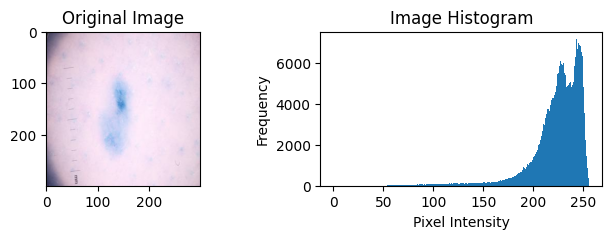

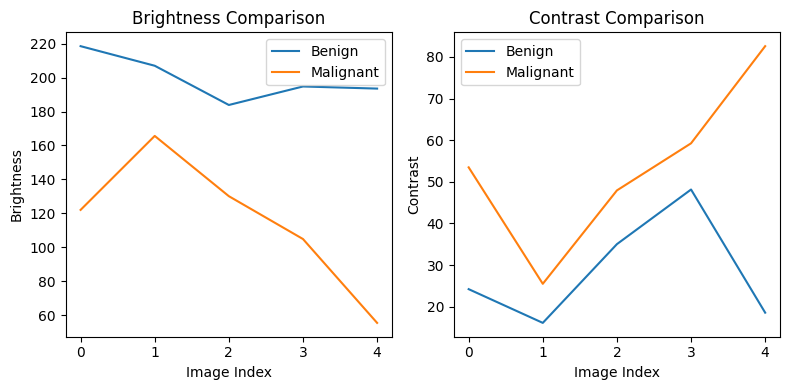

In [ ]:
def analyze_brightness_contrast(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error: Could not read image at {image_path}")
        return None, None

    brightness = np.mean(img)
    contrast = np.std(img)

    return brightness, contrast

image_path = unique_train_benign[0]
brightness, contrast = analyze_brightness_contrast(image_path)

if brightness is not None and contrast is not None:
    print(f"Brightness: {brightness}")
    print(f"Contrast: {contrast}")

    # Visualize brightness and contrast
    plt.figure(figsize=(8,2))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.imread(image_path)) # display original image
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.hist(cv2.imread(image_path).ravel(), 256, [0, 256]) # display histogram
    plt.title('Image Histogram')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()

# Function to process multiple images
def process_multiple_images(image_paths, num_images=5):
    brightness_values = []
    contrast_values = []
    for image_path in image_paths[:num_images]:
        brightness, contrast = analyze_brightness_contrast(image_path)
        if brightness is not None and contrast is not None:
            brightness_values.append(brightness)
            contrast_values.append(contrast)

    return brightness_values, contrast_values

benign_brightness, benign_contrast = process_multiple_images(unique_train_benign)
malignant_brightness, malignant_contrast = process_multiple_images(unique_train_malignant)

# Plot the brightness and contrast values
plt.figure(figsize=(8,4))
plt.subplot(1, 2, 1)
plt.plot(benign_brightness, label='Benign')
plt.plot(malignant_brightness, label='Malignant')
plt.xlabel('Image Index')
plt.ylabel('Brightness')
plt.title('Brightness Comparison')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(benign_contrast, label='Benign')
plt.plot(malignant_contrast, label='Malignant')
plt.xlabel('Image Index')
plt.ylabel('Contrast')
plt.title('Contrast Comparison')
plt.legend()

plt.tight_layout()
plt.show()

The analysis shows that benign images generally have higher brightness and lower contrast, Whereas malignant images display lower brightness and higher contrast.

**Noise Level Comparison in Benign and Malignant Images**

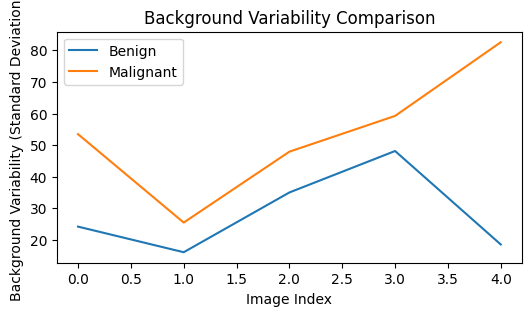

In [ ]:
def analyze_background_variability(image_paths, num_images=5):
    variability_scores = []
    for image_path in image_paths[:num_images]:
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error: Could not read image at {image_path}")
            continue
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        variability = np.std(gray) # Standard deviation as variability measure
        variability_scores.append(variability)
    return variability_scores

benign_variability = analyze_background_variability(unique_train_benign)
malignant_variability = analyze_background_variability(unique_train_malignant)

plt.figure(figsize=(6,3))
plt.plot(benign_variability, label='Benign')
plt.plot(malignant_variability, label='Malignant')
plt.xlabel('Image Index')
plt.ylabel('Background Variability (Standard Deviation)')
plt.title('Background Variability Comparison')
plt.legend()
plt.show()

By plotting background variability scores for a subset of images, we observe that benign and malignant images show differing levels of consistency in their backgrounds.

**Normalization of the Images**

In [ ]:
unique_train_dir = '/content/melanoma_cancer_dataset/train_unique'
unique_test_dir = '/content/melanoma_cancer_dataset/test_unique'

# Define the image lists using glob
unique_train_benign = glob(os.path.join(unique_train_dir, 'benign/*')) # Use os.path.join for platform compatibility and call glob
unique_train_malignant = glob(os.path.join(unique_train_dir, 'malignant/*'))
unique_test_benign = glob(os.path.join(unique_test_dir, 'benign/*'))
unique_test_malignant = glob(os.path.join(unique_test_dir, 'malignant/*'))

def preprocess_images(image_list,target_size=(128,128)):
  processed_images = []
  for image_path in image_list:
    img = Image.open(image_path)
    img_resized = img.resize(target_size)
    img_array = np.array(img_resized) / 255.0
    processed_images.append(img_array)
  return np.array(processed_images)

train_benign_preprocessed = preprocess_images(unique_train_benign)
train_malignant_preprocessed = preprocess_images(unique_train_malignant)
test_benign_preprocessed = preprocess_images(unique_test_benign)
test_malignant_preprocessed = preprocess_images(unique_test_malignant)

print(f"Train Benign Images Shape: {train_benign_preprocessed.shape}")
print(f"Train Malignant Images Shape: {train_malignant_preprocessed.shape}")
print(f"Test Benign Images Shape: {test_benign_preprocessed.shape}")
print(f"Test Malignant Images Shape: {test_malignant_preprocessed.shape}")

Train Benign Images Shape: (4992, 128, 128, 3)
Train Malignant Images Shape: (4587, 128, 128, 3)
Test Benign Images Shape: (499, 128, 128, 3)
Test Malignant Images Shape: (500, 128, 128, 3)


**Pixel Distribution Before vs After Preprocessing**

In [ ]:
def plot_pixel_distribution(image_list,processed_images,title):
  original_img = np.array(Image.open(image_list[0]))
  processed_images=processed_images[0]

  plt.figure(figsize=(10,4))
  plt.subplot(1,2,1)
  plt.hist(original_img.ravel(),bins=256,color='red',alpha=0.5)
  plt.title(f'{title}-Original Image Pixel Distribution')
  plt.xlabel('Pixel Intensity')
  plt.ylabel('Frequency')

  plt.subplot(1,2,2)
  plt.hist(processed_images.ravel(),bins=256,color='blue',alpha=0.5)
  plt.title(f'{title}-Processed Image Pixel Distribution')
  plt.xlabel('Pixel Intensity')
  plt.ylabel('Frequency')

  plt.tight_layout()
  plt.show()

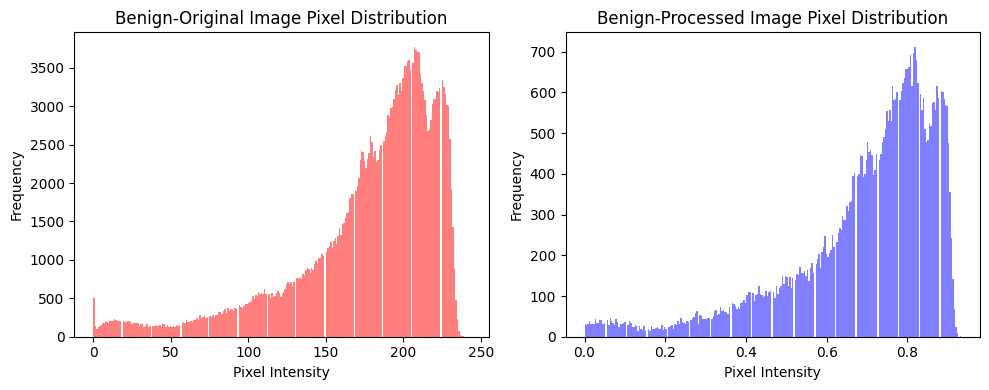

In [ ]:
plot_pixel_distribution(unique_train_benign,train_benign_preprocessed,'Benign')

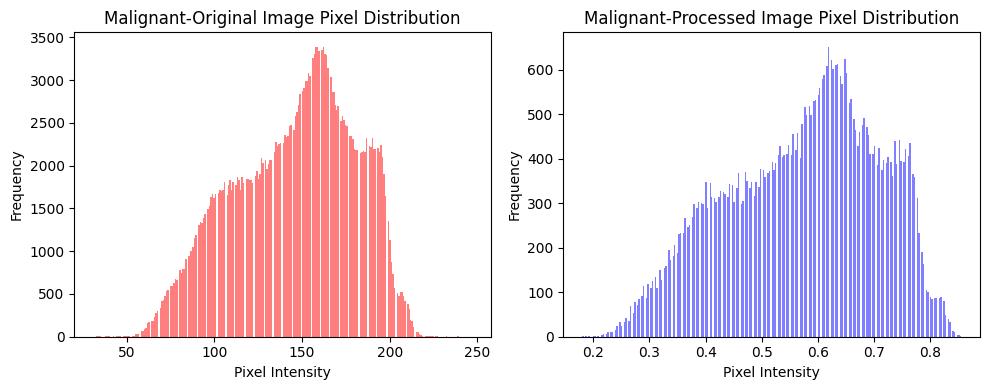

In [ ]:
plot_pixel_distribution(unique_train_malignant,train_malignant_preprocessed,'Malignant')

The analysis of frequency of pixel remains almost similar even after Normalization.

**Comparision of Original and Normalized Images**

In [ ]:
def plot_image_grid(image_list,processed_images,title):
  n = min(2,len(image_list))
  plt.figure(figsize=(10,5))
  for i in range(n):
    #Original Image
    plt.subplot(n,2,2*i+1)
    img = Image.open(image_list[i])
    plt.imshow(img)
    plt.title(f'Original Image {i+1}')
    plt.axis('off')
    #processed Image
    plt.subplot(n,2,2*i+2)
    plt.imshow(processed_images[i])
    plt.title(f'Processed Image {i+1}')
    plt.axis('off')

  plt.suptitle(f'{title}- Original v/s Processed Images',fontsize=16)
  plt.tight_layout()
  plt.show()

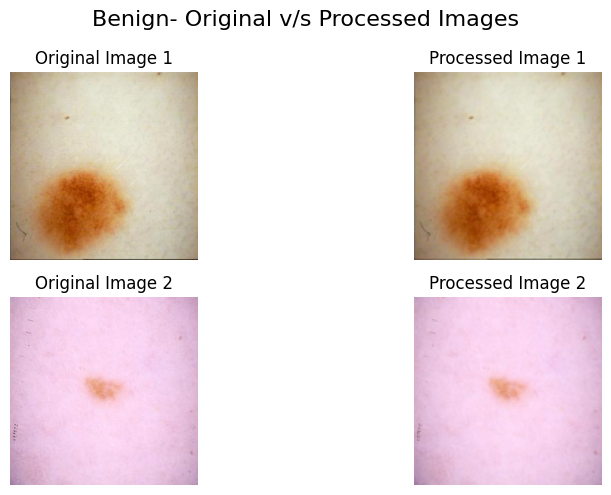

In [ ]:
plot_image_grid(unique_train_benign,train_benign_preprocessed,'Benign')

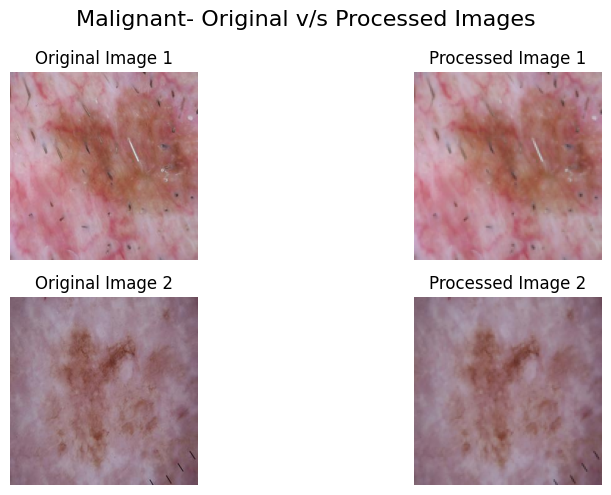

In [ ]:
plot_image_grid(unique_train_malignant,train_malignant_preprocessed,'Malignant')

After normalization the colors appear more standarized and balanced.

**Heatmap Distribution for Original vs Normalized Image**

In [ ]:
def plot_heatmap_pixel_distribution(image_list,processed_images_list, title):
  original_img = np.array(Image.open(image_list[0]))
  processed_img = processed_images_list[0]

  plt.figure(figsize=(8,4))
  plt.subplot(1, 2, 1)
  sns.heatmap(original_img[:, :,0], cmap='Blues', annot=False, fmt='d')
  plt.imshow(original_img)
  plt.title(f'Original Image')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  sns.heatmap(processed_img[:, :, 0], cmap='Blues', annot=False, fmt='d')
  plt.imshow(processed_img)
  plt.title(f'Processed Image')
  plt.axis('off')

  plt.suptitle(f'{title} - Pixel Distribution', fontsize=16, weight='bold')
  plt.tight_layout()

  plt.show()

**Heatmap Distribution for Benign**

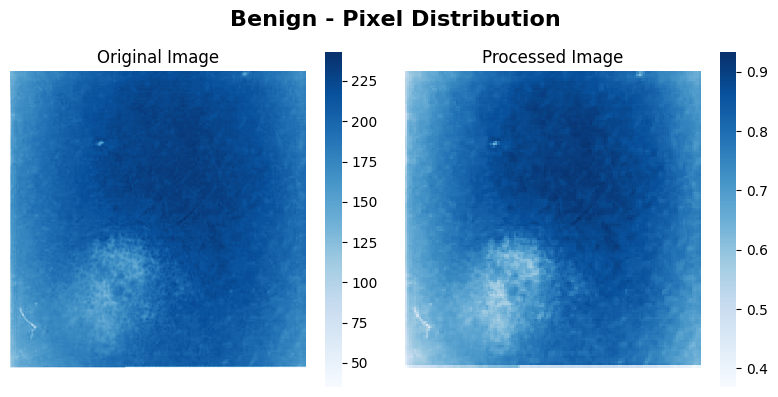

In [ ]:
plot_heatmap_pixel_distribution(unique_train_benign,train_benign_preprocessed,'Benign')

Analysis of original heatmap has some regions extremely bright while others are very dark.In the normalized heatmap,these extremes are less noticeable and values cover a broder range more evenly.

**Heatmap Distribution for Malignant**

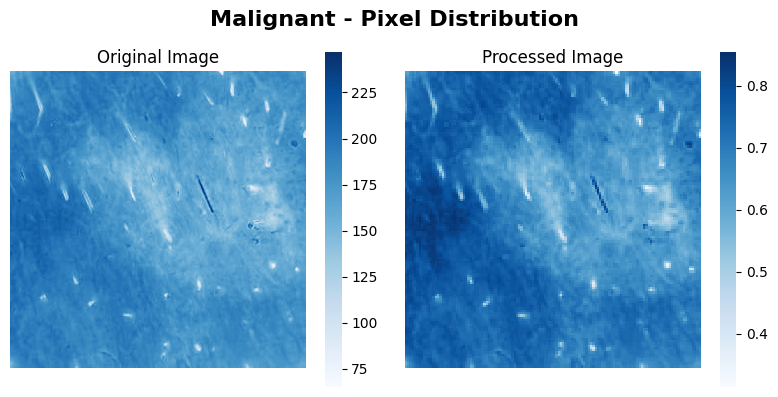

In [ ]:
plot_heatmap_pixel_distribution(unique_train_malignant,train_malignant_preprocessed,'Malignant')

The preprocessing phase has effectively standardized the dominance of specific color channels, particularly the whites and darker regions, resulting in uniformity across the processed images.

This enhancement minimizes color bias and ensures that variations in illumination and color saturation do not adversely affect model training.

**Performing Grayscale on Train Data**

In [ ]:
# Define paths for the source and destination directories
dataset_path = '/content/melanoma_cancer_dataset'
grayscale_dir= dataset_path

gray_benign_path = os.path.join(dataset_path, 'train_unique', 'gray_benign')
gray_malignant_path = os.path.join(dataset_path, 'train_unique', 'gray_malignant')

# Create destination directories for grayscale images
os.makedirs(grayscale_dir, exist_ok=True)
os.makedirs(gray_benign_path, exist_ok=True)
os.makedirs(gray_malignant_path, exist_ok=True)

**Grayscaling Benign Images**

In [ ]:
# Function to convert benign images to grayscale
def convert_benign_to_grayscale(source_folder, dest_folder):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        if os.path.isfile(img_path):
            with Image.open(img_path) as img:
                gray_img = img.convert("L")  # Convert to grayscale
                gray_img.save(os.path.join(dest_folder, img_file))  # Save in the new folder

# Define the source path for benign images
benign_path = os.path.join(dataset_path, 'train_unique', 'benign')

# Convert malignant images to grayscale
convert_benign_to_grayscale(benign_path, gray_benign_path)

**Grayscaling Malignant Images**

In [ ]:
# Function to convert malignant images to grayscale
def convert_malignant_to_grayscale(source_folder, dest_folder):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        if os.path.isfile(img_path):
            with Image.open(img_path) as img:
                gray_img = img.convert("L")  # Convert to grayscale
                gray_img.save(os.path.join(dest_folder, img_file))  # Save in the new folder

# Define the source path for malignant images
malignant_path = os.path.join(dataset_path, 'train_unique', 'malignant')

# Convert malignant images to grayscale
convert_malignant_to_grayscale(malignant_path, gray_malignant_path)

**Counting number of Grayscale images Created**

In [ ]:
# Function to count the number of images in a given folder
def count_images(folder_path):
    return len([img_file for img_file in os.listdir(folder_path) if img_file.endswith(('.png', '.jpg', '.jpeg'))])

# Count images in the benign and malignant original folders
benign_image_count = count_images(benign_path)
malignant_image_count = count_images(malignant_path)

# Count images in the grayscale folders
gray_benign_image_count = count_images(gray_benign_path)
gray_malignant_image_count = count_images(gray_malignant_path)

# Print the counts
print(f'Number of original benign images: {benign_image_count}')
print(f'Number of original malignant images: {malignant_image_count}')
print(f'Number of grayscale benign images: {gray_benign_image_count}')
print(f'Number of grayscale malignant images: {gray_malignant_image_count}')

Number of original benign images: 4992
Number of original malignant images: 4587
Number of grayscale benign images: 4992
Number of grayscale malignant images: 4587


**Displaying few Grayscale Images and Comparing with Original**

In [ ]:
def display_random_comparison(original_folder, gray_folder, num_images=5):
    original_images = os.listdir(original_folder)

    # Randomly select a specified number of images
    sample_images = random.sample(original_images, min(num_images, len(original_images)))

    plt.figure(figsize=(15, 6))

    for i, img_file in enumerate(sample_images):
        # Load original and grayscale images
        original_img_path = os.path.join(original_folder, img_file)
        gray_img_path = os.path.join(gray_folder, img_file)

        original_img = Image.open(original_img_path)
        gray_img = Image.open(gray_img_path)

        # Display original image
        plt.subplot(2, num_images, i + 1)
        plt.imshow(original_img)
        plt.axis('off')  # Hide axes
        plt.title('Original')

        # Display grayscale image
        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(gray_img, cmap='gray')
        plt.axis('off')  # Hide axes
        plt.title('Grayscale')

    plt.tight_layout()
    plt.show()

**Benign Original v/s Grayscale Images**

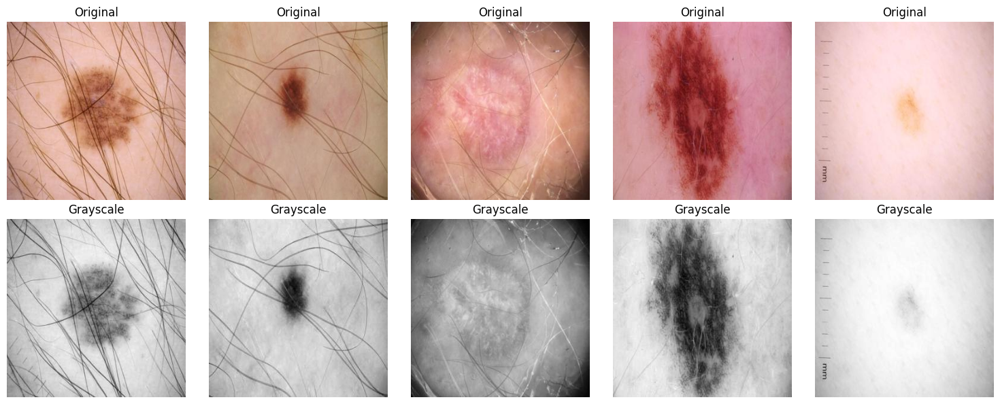

In [ ]:
# Define paths for benign images (original and grayscale)
benign_path = os.path.join(dataset_path, 'train_unique', 'benign')
gray_benign_path = os.path.join(dataset_path, 'train_unique', 'gray_benign')

# Display random comparison of original and grayscale images
display_random_comparison(benign_path, gray_benign_path, num_images=5)

**Malignant Original v/s Grayscale Images**

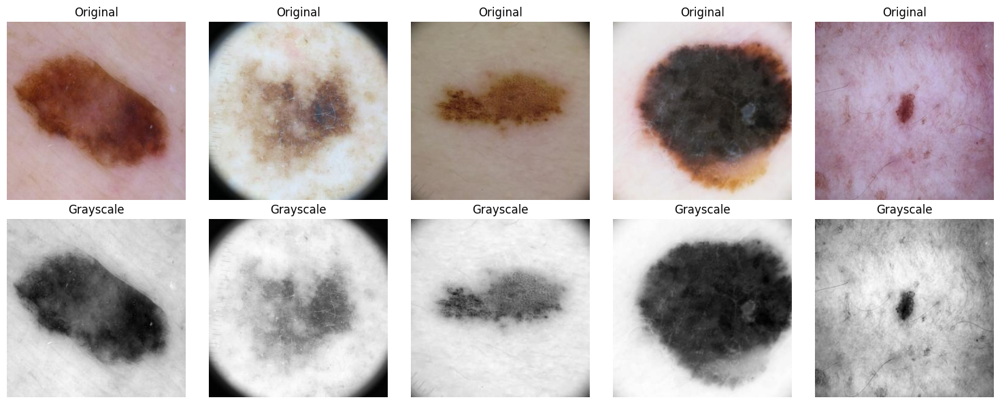

In [ ]:
# Define paths for malignant images (original and grayscale)
malignant_path = os.path.join(dataset_path, 'train_unique', 'malignant')
gray_malignant_path = os.path.join(dataset_path, 'train_unique', 'gray_malignant')

# Display random comparison of original and grayscale images for malignant
display_random_comparison(malignant_path, gray_malignant_path, num_images=5)

The grayscale transformation reduces the image's color channels to a single intensity channel, which can help simplify image analysis by focusing on intensity variations alone.

**Performing Grayscale on Test Data**

In [ ]:
# Define paths for the source and destination directories
dataset_path = '/content/melanoma_cancer_dataset'
gray_benign_path = os.path.join(dataset_path, 'test_unique', 'gray_benign')
gray_malignant_path = os.path.join(dataset_path, 'test_unique', 'gray_malignant')

# Create destination directories for grayscale images
os.makedirs(gray_benign_path, exist_ok=True)
os.makedirs(gray_malignant_path, exist_ok=True)

**Grayscaling Test Benign Images**

In [ ]:
# Function to convert benign images to grayscale
def convert_benign_to_grayscale(source_folder, dest_folder):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        if os.path.isfile(img_path):
            with Image.open(img_path) as img:
                gray_img = img.convert("L")  # Convert to grayscale
                gray_img.save(os.path.join(dest_folder, img_file))  # Save in the new folder

# Define the source path for benign images
benign_path = os.path.join(dataset_path, 'test_unique', 'benign')

# Convert malignant images to grayscale
convert_benign_to_grayscale(benign_path, gray_benign_path)

**Grayscaling Test Malignant Images**

In [ ]:
# Function to convert malignant images to grayscale
def convert_malignant_to_grayscale(source_folder, dest_folder):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        if os.path.isfile(img_path):
            with Image.open(img_path) as img:
                gray_img = img.convert("L")  # Convert to grayscale
                gray_img.save(os.path.join(dest_folder, img_file))  # Save in the new folder

# Define the source path for malignant images
malignant_path = os.path.join(dataset_path, 'test_unique', 'malignant')

# Convert malignant images to grayscale
convert_malignant_to_grayscale(malignant_path, gray_malignant_path)

**Counting Number of Test Grayscale Images Created**

In [ ]:
# Function to count the number of images in a given folder
def count_images(folder_path):
    return len([img_file for img_file in os.listdir(folder_path) if img_file.endswith(('.png', '.jpg', '.jpeg'))])

# Count images in the benign and malignant original folders
benign_image_count = count_images(benign_path)
malignant_image_count = count_images(malignant_path)

# Count images in the grayscale folders
gray_benign_image_count = count_images(gray_benign_path)
gray_malignant_image_count = count_images(gray_malignant_path)

# Print the counts
print(f'Number of original benign images: {benign_image_count}')
print(f'Number of original malignant images: {malignant_image_count}')
print(f'Number of grayscale benign images: {gray_benign_image_count}')
print(f'Number of grayscale malignant images: {gray_malignant_image_count}')

Number of original benign images: 499
Number of original malignant images: 500
Number of grayscale benign images: 499
Number of grayscale malignant images: 500


**Comparison of Original and Grayscale Images for Benign and Malignant Classes**

In [ ]:
def display_random_comparison(original_folder, gray_folder, num_images=5):
    original_images = os.listdir(original_folder)

    # Randomly select a specified number of images
    sample_images = random.sample(original_images, min(num_images, len(original_images)))

    plt.figure(figsize=(15, 6))

    for i, img_file in enumerate(sample_images):
        # Load original and grayscale images
        original_img_path = os.path.join(original_folder, img_file)
        gray_img_path = os.path.join(gray_folder, img_file)

        original_img = Image.open(original_img_path)
        gray_img = Image.open(gray_img_path)

        # Display original image
        plt.subplot(2, num_images, i + 1)
        plt.imshow(original_img)
        plt.axis('off')  # Hide axes
        plt.title('Original')

        # Display grayscale image
        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(gray_img, cmap='gray')
        plt.axis('off')  # Hide axes
        plt.title('Grayscale')

    plt.tight_layout()
    plt.show()

**Test Benign Grayscale Images**

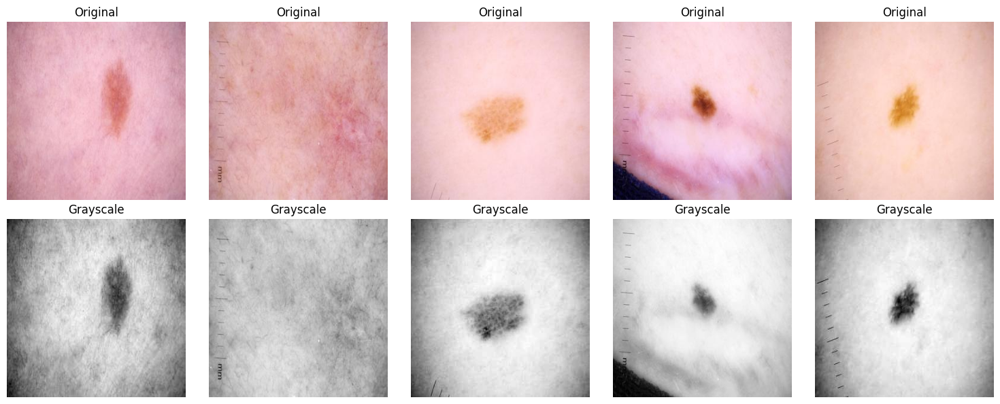

In [ ]:
# Define paths for benign images (original and grayscale)
benign_path = os.path.join(dataset_path, 'test_unique', 'benign')
gray_benign_path = os.path.join(dataset_path, 'test_unique', 'gray_benign')

# Display random comparison of original and grayscale images
display_random_comparison(benign_path, gray_benign_path, num_images=5)

**Test Malignant Grayscale Images**

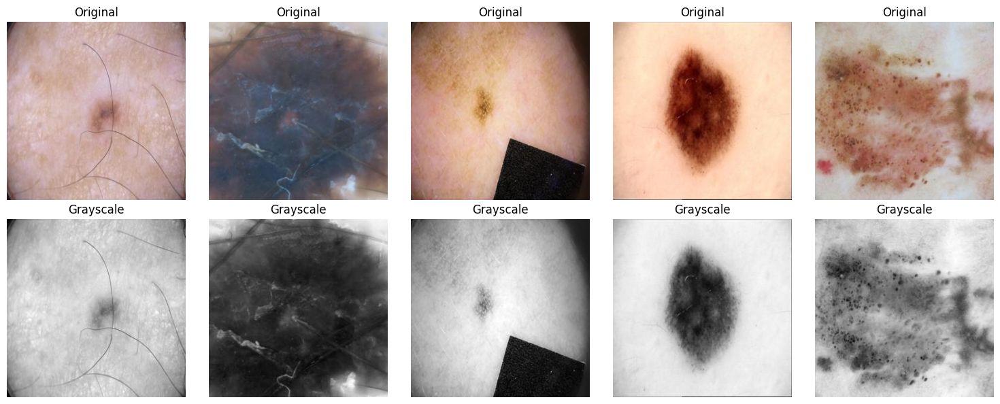

In [ ]:
# Define paths for malignant images (original and grayscale)
malignant_path = os.path.join(dataset_path, 'test_unique', 'malignant')
gray_malignant_path = os.path.join(dataset_path, 'test_unique', 'gray_malignant')

# Display random comparison of original and grayscale images for malignant
display_random_comparison(malignant_path, gray_malignant_path, num_images=5)

**Visualizing Histogram Equalization in Grayscale Images**

**Purpose:** Histogram equalization in grayscale images enhances image contrast by redistributing pixel intensity values to achieve a more uniform histogram.

In [ ]:
def visualize_histogram_equalization(image_path):
    # Load the image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error: Could not read image at {image_path}")
        return

    # Calculate the histogram of the original image
    hist, bins = np.histogram(img.flatten(), 256, [0, 256])

    # Perform histogram equalization
    equ = cv2.equalizeHist(img)

    # Calculate the histogram of the equalized image
    hist_eq, bins_eq = np.histogram(equ.flatten(), 256, [0, 256])

    # Plot the histograms
    plt.figure(figsize=(6,3))

    plt.subplot(1, 2, 1)
    plt.plot(hist)
    plt.title('Original Image Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')

    plt.subplot(1, 2, 2)
    plt.plot(hist_eq)
    plt.title('Equalized Image Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

    # Display the original and equalized images
    plt.figure(figsize=(6,3))

    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(equ, cmap='gray')
    plt.title('Equalized Image')

    plt.tight_layout()
    plt.show()

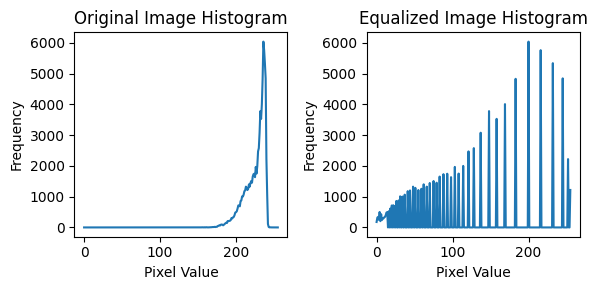

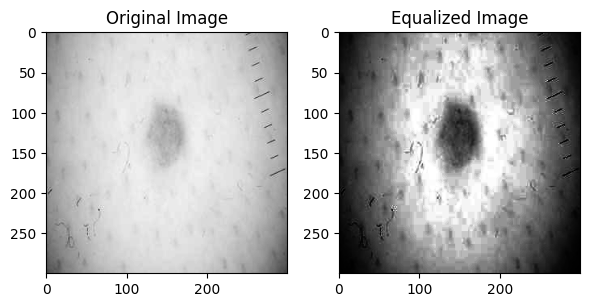

In [ ]:
visualize_histogram_equalization(unique_train_benign[0])

In the original image histogram, peaks may cluster in specific intensity ranges.

The equalized histogram should ideally spread out across a wider range, indicating a more balanced intensity distribution.

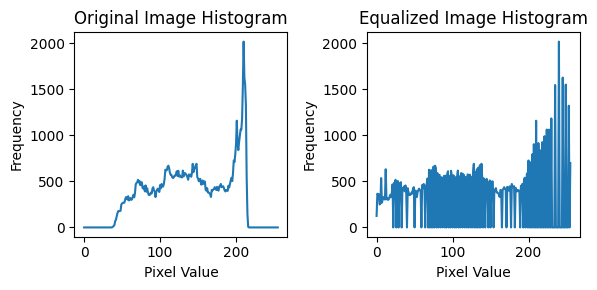

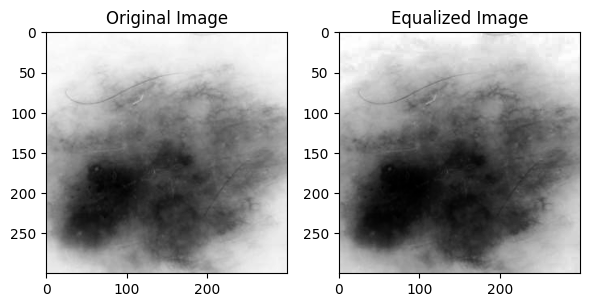

In [ ]:
visualize_histogram_equalization(unique_train_malignant[0])

The equalized image generally has improved contrast, making finer details more visible.

**Contour Detection in Grayscale Images**

**Purpose:**Contour detection in grayscale images identifies and outlines the boundaries of shapes or objects, facilitating shape analysis and feature extraction for various image processing tasks.

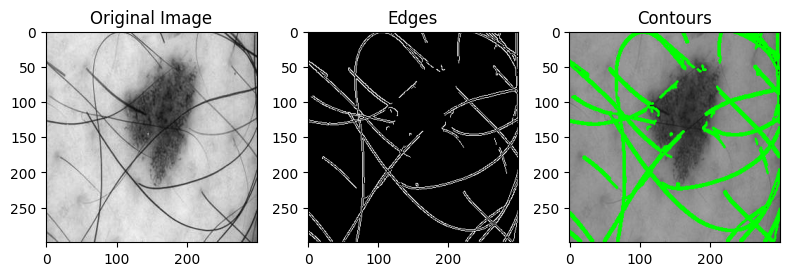

In [ ]:
def visualize_contour_detection(image_path):
    # Load the image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error: Could not read image at {image_path}")
        return

    # Apply Canny edge detection
    edges = cv2.Canny(img, 100, 200)  # Adjust thresholds as needed

    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of the original image to draw contours on
    img_with_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)  # Convert to BGR for drawing colored contours

    # Draw the contours on the image
    cv2.drawContours(img_with_contours, contours, -1, (0, 255, 0), 2) # Green contours, thickness 2

    # Display the original, edges and the image with contours
    plt.figure(figsize=(8,3))

    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(edges, cmap='gray')
    plt.title('Edges')

    plt.subplot(1, 3, 3)
    plt.imshow(img_with_contours)  # No need for cmap here since it's BGR
    plt.title('Contours')


    plt.tight_layout()
    plt.show()

# Example usage
visualize_contour_detection(unique_train_benign[1])

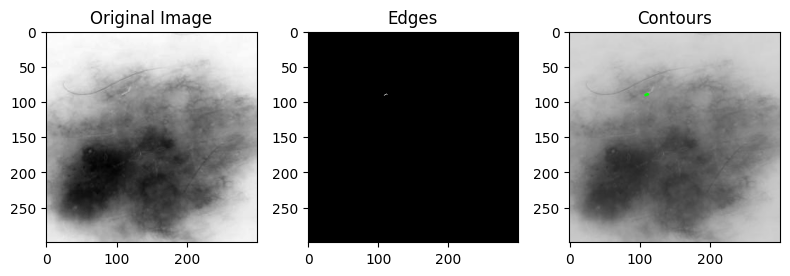

In [ ]:
visualize_contour_detection(unique_train_malignant[0])

Edge Detection:The analysis highlights the edges in the input images using Canny edge detection, providing a clear distinction between object boundaries and background.

From analysis the function effectively identifies and visualizes contours in the input images by first detecting edges and then outlining the contours in green. This process highlights the boundaries of objects within the images, facilitating further analysis and interpretation of shapes and structures.

**Morphological Transformations in Grayscale Images**

**Purpose**:Morphological transformations in grayscale images manipulate the shapes and structures of objects to enhance image features, remove noise, and improve object recognition and segmentation in image analysis.

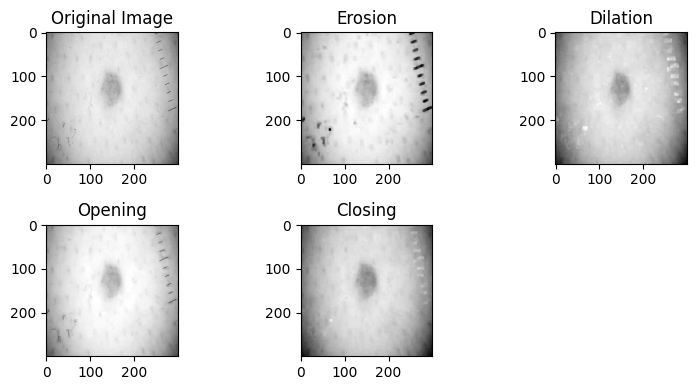

In [ ]:
def visualize_morphological_transformations(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error: Could not read image at {image_path}")
        return

    kernel = np.ones((5, 5), np.uint8)  # Define a kernel for morphological operations

    # Erosion
    erosion = cv2.erode(img, kernel, iterations=1)

    # Dilation
    dilation = cv2.dilate(img, kernel, iterations=1)

    # Opening (Erosion followed by dilation)
    opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    # Closing (Dilation followed by erosion)
    closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)

    # Display the original and transformed images
    plt.figure(figsize=(8,4))

    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')

    plt.subplot(2, 3, 2)
    plt.imshow(erosion, cmap='gray')
    plt.title('Erosion')

    plt.subplot(2, 3, 3)
    plt.imshow(dilation, cmap='gray')
    plt.title('Dilation')

    plt.subplot(2, 3, 4)
    plt.imshow(opening, cmap='gray')
    plt.title('Opening')

    plt.subplot(2, 3, 5)
    plt.imshow(closing, cmap='gray')
    plt.title('Closing')

    plt.tight_layout()
    plt.show()

# Example usage:
visualize_morphological_transformations(unique_train_benign[0])

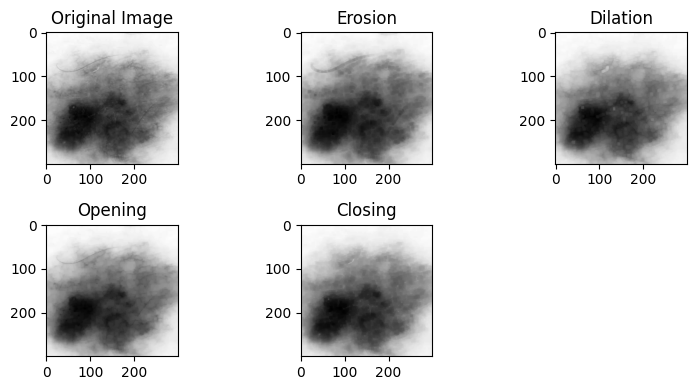

In [ ]:
visualize_morphological_transformations(unique_train_malignant[0])

Erosion: It reduces the boundaries of objects in an image by removing pixels from the edges based on a specified structuring element.

Dilation:It increases the boundaries of objects in an image by adding pixels to the edges based on a specified structuring element.

Opening: It is used to remove small objects from an image while preserving the shape and size of larger objects.

Closing: It is used to close small gaps or holes in objects while preserving their overall shape.

These transformations can enhance or reduce specific features within the images.Often used to remove noise or to bridge gaps in detected edges.

**Directory to store the train agumented images**

In [ ]:
# Define dataset paths
dataset_path = '/content/melanoma_cancer_dataset'
color_benign_path = os.path.join(dataset_path, 'train_unique', 'benign')
gray_benign_path = os.path.join(dataset_path, 'train_unique', 'gray_benign')
augmented_benign_path = os.path.join(dataset_path, 'train_unique', 'augmented_benign')

color_malignant_path = os.path.join(dataset_path, 'train_unique', 'malignant')
gray_malignant_path = os.path.join(dataset_path, 'train_unique', 'gray_malignant')
augmented_malignant_path = os.path.join(dataset_path, 'train_unique', 'augmented_malignant')

# Ensure directories exist for augmented images
os.makedirs(augmented_benign_path, exist_ok=True)
os.makedirs(augmented_malignant_path, exist_ok=True)

**Data Agumentation on Train Data**

In [ ]:
# Set up augmentation configurations
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

def augment_images(source_folder, dest_folder, num_augmented_images=5):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        with Image.open(img_path) as img:
            img_array = np.array(img)
            img_array = img_array.reshape((1,) + img_array.shape + (1,))  # Add channels dimension

            for i, batch in enumerate(datagen.flow(img_array, batch_size=1)):
                aug_img = Image.fromarray(batch[0].reshape(batch[0].shape[:-1]).astype('uint8'))

                # Get augmentation type (from the configuration) and add it to the filename
                if i == 0:
                    aug_type = "Flipped"
                elif i == 1:
                    aug_type = "Rotated"
                elif i == 2:
                    aug_type = "Cropped"
                elif i == 3:
                    aug_type = "Translated"
                else:
                    aug_type = "Sheared"

                aug_img.save(os.path.join(dest_folder, f'aug_{aug_type}_{i}_{img_file}'))
                if i >= num_augmented_images - 1:
                    break

In [ ]:
augment_images(gray_benign_path, augmented_benign_path)
augment_images(gray_malignant_path, augmented_malignant_path)

**Displaying few Augmented Images**

In [ ]:
def display_random_images_with_labels(num_images=3, num_augmented=5, font_size=10):
    benign_files = random.sample(os.listdir(color_benign_path), num_images)
    malignant_files = random.sample(os.listdir(color_malignant_path), num_images)

    for files, label, color_path, gray_path, aug_path in [
        (benign_files, "Benign", color_benign_path, gray_benign_path, augmented_benign_path),
        (malignant_files, "Malignant", color_malignant_path, gray_malignant_path, augmented_malignant_path)
    ]:
        for file in files:
            fig, axes = plt.subplots(1, 2 + num_augmented, figsize=(20, 4))

            # Display color image
            color_img = Image.open(os.path.join(color_path, file))
            axes[0].imshow(color_img)
            axes[0].set_title(f"{label} - Original Color", fontsize=font_size)  # Set font size
            axes[0].axis("off")

            # Display grayscale image
            gray_img = Image.open(os.path.join(gray_path, file))
            axes[1].imshow(gray_img, cmap='gray')
            axes[1].set_title(f"{label} - Grayscale", fontsize=font_size)  # Set font size
            axes[1].axis("off")

            # Display augmented images with labels indicating augmentation type
            aug_files = [f for f in os.listdir(aug_path) if file in f][:num_augmented]
            for idx, aug_file in enumerate(aug_files):
                aug_img = Image.open(os.path.join(aug_path, aug_file))
                aug_type = aug_file.split('_')[1]  # Extract the augmentation type from the filename
                axes[idx + 2].imshow(aug_img, cmap='gray')
                axes[idx + 2].set_title(f"{label} - {aug_type}", fontsize=font_size)  # Set font size
                axes[idx + 2].axis("off")

            plt.show()


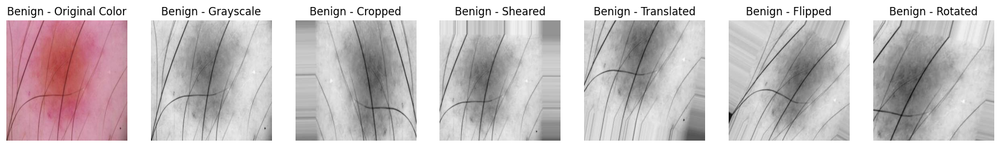

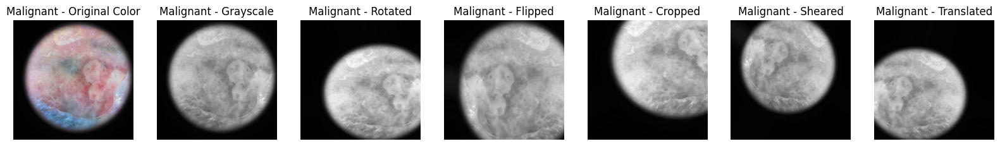

In [ ]:
display_random_images_with_labels(num_images=1, num_augmented=5, font_size=12)

**Directory to store the Test agumented images**

In [ ]:
# Define dataset paths
dataset_path = '/content/melanoma_cancer_dataset'

# Paths for benign and malignant test images
color_benign_path = os.path.join(dataset_path, 'test_unique', 'benign')  # Changed to 'test'
gray_benign_path = os.path.join(dataset_path, 'test_unique', 'gray_benign')  # Changed to 'test'
augmented_benign_path = os.path.join(dataset_path, 'test_unique', 'augmented_benign')  # Changed to 'test'

color_malignant_path = os.path.join(dataset_path, 'test_unique', 'malignant')  # Changed to 'test'
gray_malignant_path = os.path.join(dataset_path, 'test_unique', 'gray_malignant')  # Changed to 'test'
augmented_malignant_path = os.path.join(dataset_path, 'test_unique', 'augmented_malignant')  # Changed to 'test'

# Ensure directories exist for augmented images in the test dataset
os.makedirs(augmented_benign_path, exist_ok=True)
os.makedirs(augmented_malignant_path, exist_ok=True)

**Data Agumentation on Test Data**

In [ ]:
# Set up augmentation configurations
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

def augment_images(source_folder, dest_folder, num_augmented_images=5):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        with Image.open(img_path) as img:
            img_array = np.array(img)
            img_array = img_array.reshape((1,) + img_array.shape + (1,))  # Add channels dimension

            for i, batch in enumerate(datagen.flow(img_array, batch_size=1)):
                aug_img = Image.fromarray(batch[0].reshape(batch[0].shape[:-1]).astype('uint8'))

                # Get augmentation type (from the configuration) and add it to the filename
                if i == 0:
                    aug_type = "Flipped"
                elif i == 1:
                    aug_type = "Rotated"
                elif i == 2:
                    aug_type = "Shifted"
                elif i == 3:
                    aug_type = "Cropped"
                else:
                    aug_type = "Scaled"

                aug_img.save(os.path.join(dest_folder, f'aug_{aug_type}_{i}_{img_file}'))
                if i >= num_augmented_images - 1:
                    break

In [ ]:
augment_images(gray_benign_path, augmented_benign_path)
augment_images(gray_malignant_path, augmented_malignant_path)

**Displaying few Test Augmented Images**

In [ ]:
def display_random_images_with_labels(num_images=3, num_augmented=5, font_size=10):
    benign_files = random.sample(os.listdir(color_benign_path), num_images)
    malignant_files = random.sample(os.listdir(color_malignant_path), num_images)

    for files, label, color_path, gray_path, aug_path in [
        (benign_files, "Benign", color_benign_path, gray_benign_path, augmented_benign_path),
        (malignant_files, "Malignant", color_malignant_path, gray_malignant_path, augmented_malignant_path)
    ]:
        for file in files:
            fig, axes = plt.subplots(1, 2 + num_augmented, figsize=(20, 4))

            # Display color image
            color_img = Image.open(os.path.join(color_path, file))
            axes[0].imshow(color_img)
            axes[0].set_title(f"{label} - Original Color", fontsize=font_size)  # Set font size
            axes[0].axis("off")

            # Display grayscale image
            gray_img = Image.open(os.path.join(gray_path, file))
            axes[1].imshow(gray_img, cmap='gray')
            axes[1].set_title(f"{label} - Grayscale", fontsize=font_size)  # Set font size
            axes[1].axis("off")

            # Display augmented images with labels indicating augmentation type
            aug_files = [f for f in os.listdir(aug_path) if file in f][:num_augmented]
            for idx, aug_file in enumerate(aug_files):
                aug_img = Image.open(os.path.join(aug_path, aug_file))
                aug_type = aug_file.split('_')[1]  # Extract the augmentation type from the filename
                axes[idx + 2].imshow(aug_img, cmap='gray')
                axes[idx + 2].set_title(f"{label} - {aug_type}", fontsize=font_size)  # Set font size
                axes[idx + 2].axis("off")

            plt.show()

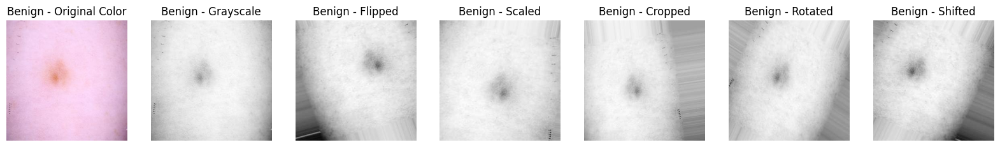

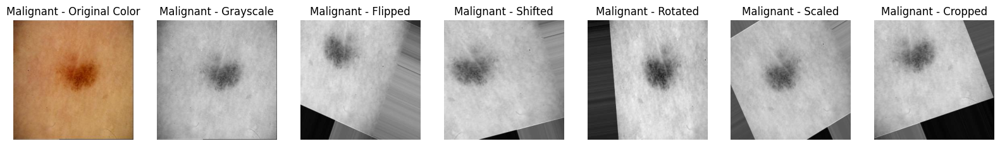

In [ ]:
display_random_images_with_labels(num_images=1, num_augmented=5, font_size=12)

**Data Agumentation on RGB Images**

In [ ]:
# Define dataset paths
dataset_path = '/content/melanoma_cancer_dataset'
color_benign_path = os.path.join(dataset_path, 'train_unique', 'benign')
augmented_rgb_benign_path = os.path.join(dataset_path, 'train_unique', 'augmented_rgb_benign')

color_malignant_path = os.path.join(dataset_path, 'train_unique', 'malignant')
augmented_rgb_malignant_path = os.path.join(dataset_path, 'train_unique', 'augmented_rgb_malignant')

# Ensure directories exist for augmented images
os.makedirs(augmented_rgb_benign_path, exist_ok=True)
os.makedirs(augmented_rgb_malignant_path, exist_ok=True)

**Data Agumentation on RGB Train Data**

In [ ]:
# Set up augmentation configurations for RGB images
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

def augment_images_rgb(source_folder, dest_folder, num_augmented_images=5):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        with Image.open(img_path) as img:
            img_array = np.array(img)
            if img_array.ndim == 2:  # Convert grayscale to RGB if needed
                img_array = np.stack([img_array] * 3, axis=-1)
            img_array = img_array.reshape((1,) + img_array.shape)  # Add batch dimension

            for i, batch in enumerate(datagen.flow(img_array, batch_size=1)):
                aug_img = Image.fromarray(batch[0].astype('uint8'))

                # Generate augmented filenames
                if i == 0:
                    aug_type = "Flipped"
                elif i == 1:
                    aug_type = "Rotated"
                elif i == 2:
                    aug_type = "Shifted"
                elif i == 3:
                    aug_type = "Zoomed"
                else:
                    aug_type = "Sheared"

                aug_img.save(os.path.join(dest_folder, f'aug_{aug_type}_{i}_{img_file}'))
                if i >= num_augmented_images - 1:
                    break


In [ ]:
augment_images_rgb(color_benign_path, augmented_rgb_benign_path)
augment_images_rgb(color_malignant_path, augmented_rgb_malignant_path)

**Displaying few Augmented Images(RGB Traindata)**

In [ ]:
def display_random_images_with_labels(num_images=3, num_augmented=5, font_size=10):
    benign_files = random.sample(os.listdir(color_benign_path), num_images)
    malignant_files = random.sample(os.listdir(color_malignant_path), num_images)

    for files, label, color_path, aug_path in [
        (benign_files, "Benign", color_benign_path, augmented_rgb_benign_path),
        (malignant_files, "Malignant", color_malignant_path, augmented_rgb_malignant_path)
    ]:
        for file in files:
            fig, axes = plt.subplots(1, 1 + num_augmented, figsize=(20, 4))

            # Display color image
            color_img = Image.open(os.path.join(color_path, file))
            axes[0].imshow(color_img)
            axes[0].set_title(f"{label} - Original Color", fontsize=font_size)  # Set font size
            axes[0].axis("off")

            # Display augmented images with labels indicating augmentation type
            aug_files = [f for f in os.listdir(aug_path) if file in f][:num_augmented]
            for idx, aug_file in enumerate(aug_files):
                aug_img = Image.open(os.path.join(aug_path, aug_file))
                aug_type = aug_file.split('_')[1]  # Extract the augmentation type from the filename
                axes[idx + 1].imshow(aug_img)
                axes[idx + 1].set_title(f"{label} - {aug_type}", fontsize=font_size)  # Set font size
                axes[idx + 1].axis("off")

            plt.show()

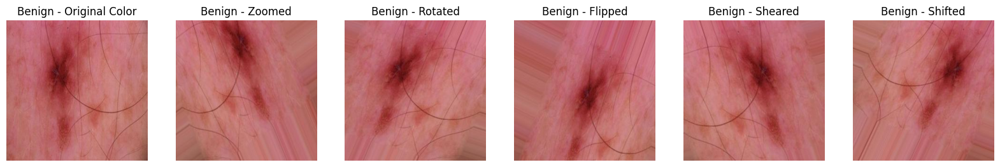

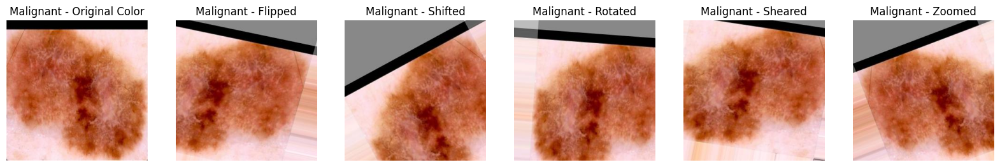

In [ ]:
display_random_images_with_labels(num_images=1, num_augmented=5, font_size=12)

**Directory to store RGB Test agumented images**

In [ ]:
# Define dataset paths
dataset_path = '/content/melanoma_cancer_dataset'
color_benign_path = os.path.join(dataset_path, 'test_unique', 'benign')
augmented_rgb_benign_path = os.path.join(dataset_path, 'test_unique', 'augmented_rgb_benign')

color_malignant_path = os.path.join(dataset_path, 'test_unique', 'malignant')
augmented_rgb_malignant_path = os.path.join(dataset_path, 'test_unique', 'augmented_rgb_malignant')

# Ensure directories exist for augmented images
os.makedirs(augmented_rgb_benign_path, exist_ok=True)
os.makedirs(augmented_rgb_malignant_path, exist_ok=True)

**Data Agumentation on RGB Test Data**

In [ ]:
# Set up augmentation configurations for RGB images
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

def augment_images_rgb(source_folder, dest_folder, num_augmented_images=5):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        with Image.open(img_path) as img:
            img_array = np.array(img)
            if img_array.ndim == 2:  # Convert grayscale to RGB if needed
                img_array = np.stack([img_array] * 3, axis=-1)
            img_array = img_array.reshape((1,) + img_array.shape)  # Add batch dimension

            for i, batch in enumerate(datagen.flow(img_array, batch_size=1)):
                aug_img = Image.fromarray(batch[0].astype('uint8'))

                # Generate augmented filenames
                if i == 0:
                    aug_type = "Flipped"
                elif i == 1:
                    aug_type = "Rotated"
                elif i == 2:
                    aug_type = "Shifted"
                elif i == 3:
                    aug_type = "Zoomed"
                else:
                    aug_type = "Sheared"

                aug_img.save(os.path.join(dest_folder, f'aug_{aug_type}_{i}_{img_file}'))
                if i >= num_augmented_images - 1:
                    break


In [ ]:
augment_images_rgb(color_benign_path, augmented_rgb_benign_path)
augment_images_rgb(color_malignant_path, augmented_rgb_malignant_path)

In [ ]:
def display_random_images_with_labels(num_images=3, num_augmented=5, font_size=10):
    benign_files = random.sample(os.listdir(color_benign_path), num_images)
    malignant_files = random.sample(os.listdir(color_malignant_path), num_images)

    for files, label, color_path, aug_path in [
        (benign_files, "Benign", color_benign_path, augmented_rgb_benign_path),
        (malignant_files, "Malignant", color_malignant_path, augmented_rgb_malignant_path)
    ]:
        for file in files:
            fig, axes = plt.subplots(1, 1 + num_augmented, figsize=(20, 4))

            # Display color image
            color_img = Image.open(os.path.join(color_path, file))
            axes[0].imshow(color_img)
            axes[0].set_title(f"{label} - Original Color", fontsize=font_size)  # Set font size
            axes[0].axis("off")

            # Display augmented images with labels indicating augmentation type
            aug_files = [f for f in os.listdir(aug_path) if file in f][:num_augmented]
            for idx, aug_file in enumerate(aug_files):
                aug_img = Image.open(os.path.join(aug_path, aug_file))
                aug_type = aug_file.split('_')[1]  # Extract the augmentation type from the filename
                axes[idx + 1].imshow(aug_img)
                axes[idx + 1].set_title(f"{label} - {aug_type}", fontsize=font_size)  # Set font size
                axes[idx + 1].axis("off")

            plt.show()

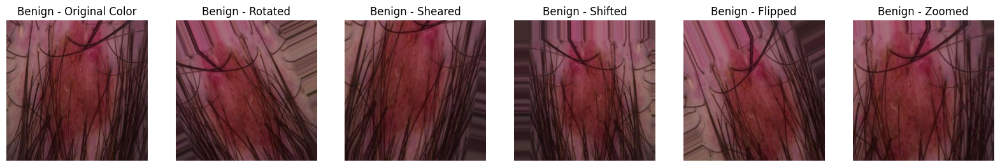

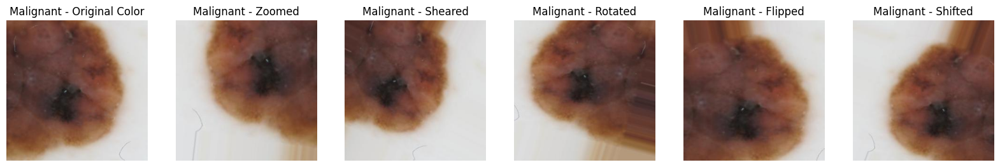

In [ ]:
display_random_images_with_labels(num_images=1, num_augmented=5, font_size=12)

**Number of Agumented Images**

In [ ]:
# Function to count images in a directory
def count_images(folder_path):
    # Count total images in the directory (both .jpg and .png)
    total_images = len([f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')])
    return total_images

# Define the dataset path
dataset_path = '/content/melanoma_cancer_dataset'

# Paths for the original directories (train and test)
train_benign_path = os.path.join(dataset_path, 'train_unique', 'benign')
train_malignant_path = os.path.join(dataset_path, 'train_unique', 'malignant')
test_benign_path = os.path.join(dataset_path, 'test_unique', 'benign')
test_malignant_path = os.path.join(dataset_path, 'test_unique', 'malignant')

# Paths for the gray and RGB augmented images (train and test)
augmented_train_gray_benign_path = os.path.join(dataset_path, 'train_unique', 'augmented_benign')
augmented_train_gray_malignant_path = os.path.join(dataset_path, 'train_unique', 'augmented_malignant')
augmented_train_rgb_benign_path = os.path.join(dataset_path, 'train_unique', 'augmented_rgb_benign')
augmented_train_rgb_malignant_path = os.path.join(dataset_path, 'train_unique', 'augmented_rgb_malignant')

augmented_test_gray_benign_path = os.path.join(dataset_path, 'test_unique', 'augmented_benign')
augmented_test_gray_malignant_path = os.path.join(dataset_path, 'test_unique', 'augmented_malignant')
augmented_test_rgb_benign_path = os.path.join(dataset_path, 'test_unique', 'augmented_rgb_benign')
augmented_test_rgb_malignant_path = os.path.join(dataset_path, 'test_unique', 'augmented_rgb_malignant')

# Collect data for original and augmented image counts (both train and test datasets)
data = [
    ('train_benign', count_images(train_benign_path), count_images(augmented_train_gray_benign_path), count_images(augmented_train_rgb_benign_path)),
    ('train_malignant', count_images(train_malignant_path), count_images(augmented_train_gray_malignant_path), count_images(augmented_train_rgb_malignant_path)),
    ('test_benign', count_images(test_benign_path), count_images(augmented_test_gray_benign_path), count_images(augmented_test_rgb_benign_path)),
    ('test_malignant', count_images(test_malignant_path), count_images(augmented_test_gray_malignant_path), count_images(augmented_test_rgb_malignant_path)),
]

# Create a DataFrame with counts for original, gray augmented, and RGB augmented images
df = pd.DataFrame(data, columns=['Category', 'Original Image Count', 'Gray Augmented Count', 'RGB Augmented Count'])

In [ ]:
df

,Category,Original Image Count,Gray Augmented Count,RGB Augmented Count
0,train_benign,4992,24960,24960
1,train_malignant,4587,22935,22935
2,test_benign,499,3493,2495
3,test_malignant,500,3500,2500


###**CNN MODEL**###

In [ ]:
!pip install tensorflow
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense,Dropout,BatchNormalization,Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the path to your dataset directories
# Define paths to train and test directories
train_dir = '/content/melanoma_cancer_dataset/train_unique'
test_dir = '/content/melanoma_cancer_dataset/test_unique'

# Model parameters
img_height, img_width = 128, 128  # Resize images for uniform input
batch_size = 32
epochs = 10

**Data Preprocessing**

In [ ]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',  # Use 'binary' for two classes (benign and malignant)
    classes=['benign', 'malignant']  # Ensure that only 'benign' and 'malignant' are included
)

# Print accessed directories in train
print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    classes=['benign', 'malignant']  # Ensure that only 'benign' and 'malignant' are included
)

# Print accessed directories in test
print("Test Generator Class Indices: ", test_generator.class_indices)

Found 9579 images belonging to 2 classes.
Train Generator Class Indices:  {'benign': 0, 'malignant': 1}
Found 999 images belonging to 2 classes.
Test Generator Class Indices:  {'benign': 0, 'malignant': 1}


**CNN Model for Unique Dataset**

In [ ]:
# Initialize a Sequential model
model1 = Sequential([
    Input(shape=(img_height, img_width, 3)),  # Define input shape here
    Conv2D(32, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification (sigmoid)
])
model1.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,665 (12.61 MB)

 Trainable params: 3,305,217 (12.61 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
model1.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])
history1 = model1.fit(train_generator, epochs=epochs, validation_data=test_generator)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.9555 - loss: 0.1163 - val_accuracy: 0.9139 - val_loss: 0.2448
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 32s 42ms/step - accuracy: 0.9622 - loss: 0.0965 - val_accuracy: 0.9019 - val_loss: 0.2727
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - accuracy: 0.9681 - loss: 0.0858 - val_accuracy: 0.8979 - val_loss: 0.3126
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - accuracy: 0.9727 - loss: 0.0709 - val_accuracy: 0.9139 - val_loss: 0.2870
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - accuracy: 0.9774 - loss: 0.0631 - val_accuracy: 0.8999 - val_loss: 0.2690
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - accuracy: 0.9730 - loss: 0.0708 - val_accuracy: 0.8939 - val_loss: 0.3544
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - accuracy: 0.9796 - loss: 0.0523 - val_accuracy: 0.8969 - val_loss: 0.3060
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - accuracy: 0.9809 - loss: 0.0516 - 

**Evaluate the Model**

In [ ]:
test_loss, test_accuracy = model1.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.9017 - loss: 0.3831
Test Loss: 0.4624653160572052
Test Accuracy: 0.8828828930854797


Model Accuracy: This measures how often the model’s predictions are correct. Higher accuracy means the model is making more accurate predictions.

Model Loss: This measures how far the model's predictions are from the actual values. Lower loss means the model is making predictions that are closer to the correct values. Loss is used during training to help the model improve by minimizing errors.

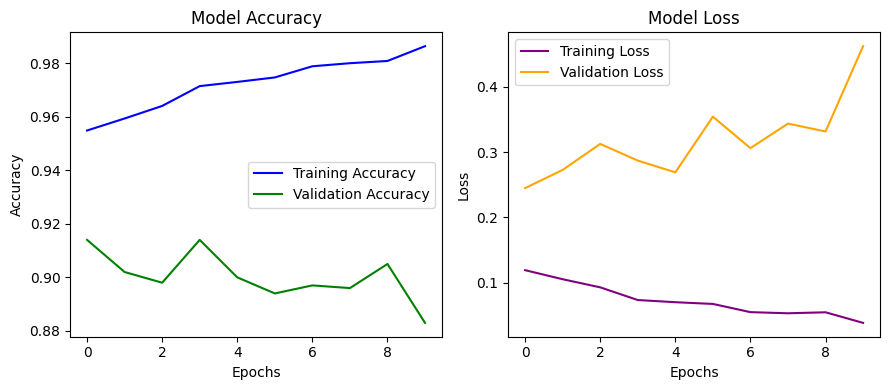

In [ ]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history1.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history1.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history1.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history1.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

Model Accuracy

Training Accuracy (blue line): This metric indicates how well the model is learning on the training dataset. The blue line shows a steady increase, which suggests that the model is learning the patterns in the training data over time.

Validation Accuracy (green line): This line represents the model's performance on the validation dataset, which helps evaluate how well it generalizes to unseen data.

The validation accuracy generally follows the training accuracy but fluctuates slightly towards the end. This fluctuation might indicate that the model is starting to overfit, as it's learning the training data well but struggles to generalize to new data.

Model Loss

Training Loss (purple line): The loss for the training data is decreasing steadily, suggesting that the model is improving its fit to the training data over time.

Validation Loss (orange line): Initially, the validation loss also decreases, but after a few epochs, it plateaus and even starts to fluctuate without significant improvement.

This pattern (where training loss decreases but validation loss stabilizes or increases) is a sign of potential overfitting. The model might be fitting too closely to the training data and not generalizing as effectively to new data.

32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step


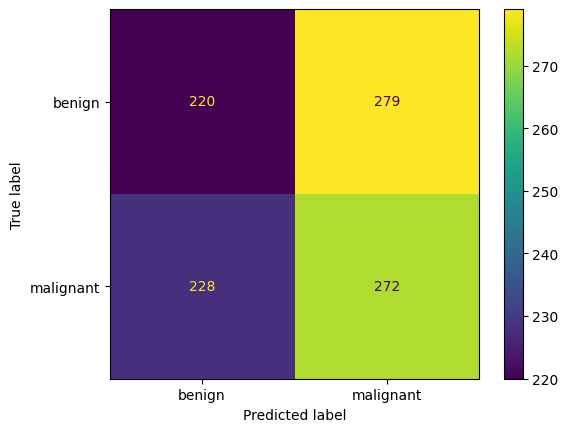

In [ ]:
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_true = test_generator.classes
y_pred = model1.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step


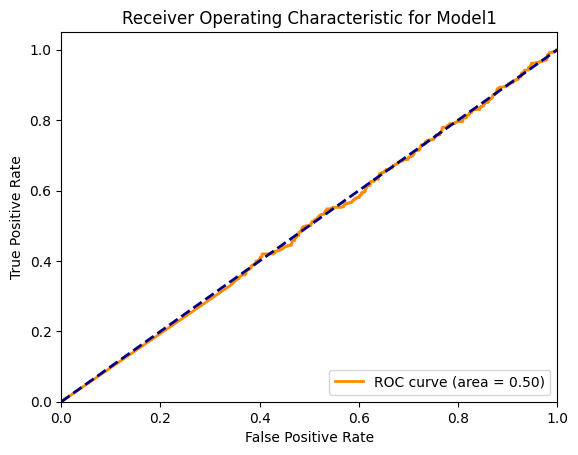

In [ ]:
# prompt: roc curve for model1

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'y_true' is the true labels and 'y_pred' is the predicted probabilities
y_true = test_generator.classes
y_pred = model1.predict(test_generator)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Model1')
plt.legend(loc="lower right")
plt.show()

**CNN Model for Grayscale Images**

In [ ]:
# Define paths to train and test directories
train_dir = '/content/melanoma_cancer_dataset/train_unique'
test_dir ='/content/melanoma_cancer_dataset/test_unique'

# Model parameters
img_height, img_width = 128, 128  # Resize images for uniform input
batch_size = 32
epochs = 10

**Data Preprocessing**

In [ ]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['gray_benign', 'gray_malignant']  # Set classes for binary classification
)

# Print accessed directories in train
print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['gray_benign', 'gray_malignant']  # Set classes for binary classification
)

# Print accessed directories in test
print("Test Generator Class Indices: ", test_generator.class_indices)

Found 9579 images belonging to 2 classes.
Train Generator Class Indices:  {'gray_benign': 0, 'gray_malignant': 1}
Found 999 images belonging to 2 classes.
Test Generator Class Indices:  {'gray_benign': 0, 'gray_malignant': 1}


**CNN Model**

In [ ]:
# Initialize a Sequential model
model2 = Sequential([
    Input(shape=(img_height, img_width, 1)),  # Define input shape here
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification (sigmoid)
])
model2.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 126, 126, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,304,193 (12.60 MB)

 Trainable params: 3,304,193 (12.60 MB)

 Non-trainable params: 0 (0.00 B)

**Compile the Model**

In [ ]:
model2.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)
history2 = model2.fit(train_generator, epochs=epochs, validation_data=test_generator)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - accuracy: 0.6935 - loss: 0.5614 - val_accuracy: 0.8579 - val_loss: 0.3264
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.8027 - loss: 0.3940 - val_accuracy: 0.8639 - val_loss: 0.2982
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.8324 - loss: 0.3582 - val_accuracy: 0.8759 - val_loss: 0.2906
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - accuracy: 0.8470 - loss: 0.3310 - val_accuracy: 0.8779 - val_loss: 0.2887
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - accuracy: 0.8544 - loss: 0.3166 - val_accuracy: 0.8859 - val_loss: 0.2612
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - accuracy: 0.8704 - loss: 0.2960 - val_accuracy: 0.8849 - val_loss: 0.2618
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.8737 - loss: 0.2900 - val_accuracy: 0.8869 - val_loss: 0.2538
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.8826 - loss: 0.2722 - val_ac

**Evaluate the Model**

In [ ]:
test_loss, test_accuracy = model2.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.8905 - loss: 0.2503
Test Loss: 0.25059935450553894
Test Accuracy: 0.8938938975334167


**Evaluate Model Loss and Model Accuracy**

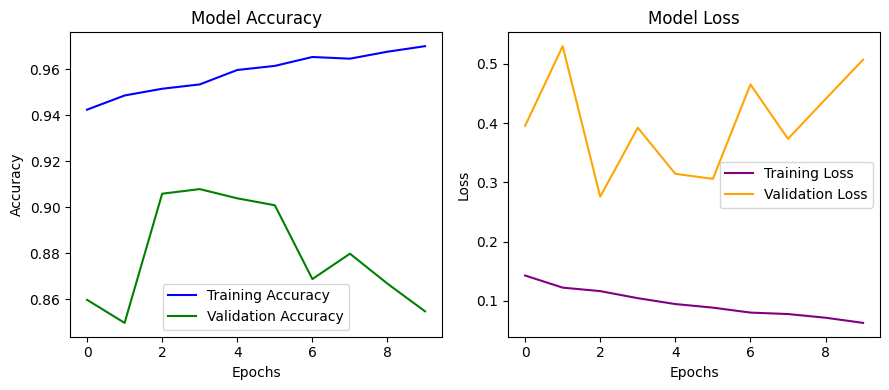

In [ ]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history2.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history2.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history2.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history2.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

**Visualize Confusion matrix and Classification report**

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step


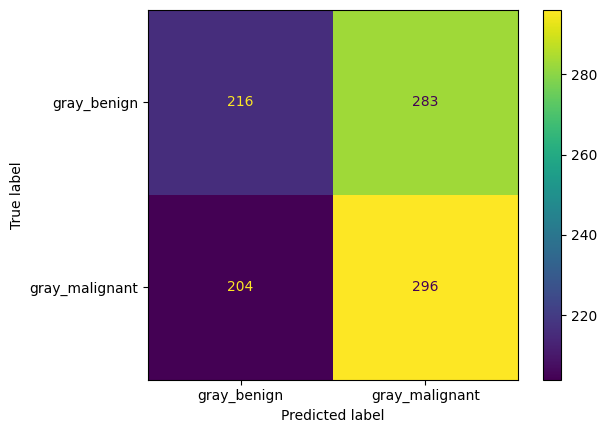

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.pyplot as plt
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
y_true = test_generator.classes
y_pred = model2.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

**Visualization of ROC Curve**

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step


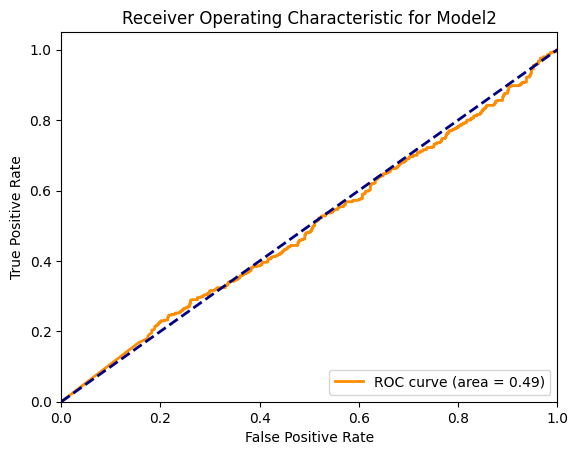

In [ ]:
y_true = test_generator.classes
y_pred = model2.predict(test_generator)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Model2')
plt.legend(loc="lower right")
plt.show()

**CNN Model for Grayscale Agumented Data**

In [ ]:
# Define paths to train and test directories
train_dir = '/content/melanoma_cancer_dataset/train_unique'
test_dir = '/content/melanoma_cancer_dataset/test_unique'

# Model parameters
img_height, img_width = 128, 128  # Resize images for uniform input
batch_size = 32
epochs = 10

**Data Preprocessing**

In [ ]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_benign', 'augmented_malignant']  # Ensure binary classification
)

# Print accessed directories in train
print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_benign', 'augmented_malignant']  # Ensure binary classification
)

# Print accessed directories in test
print("Test Generator Class Indices: ", test_generator.class_indices)

Found 47895 images belonging to 2 classes.
Train Generator Class Indices:  {'augmented_benign': 0, 'augmented_malignant': 1}
Found 4995 images belonging to 2 classes.
Test Generator Class Indices:  {'augmented_benign': 0, 'augmented_malignant': 1}


**CNN Model on Grayscaled Normalized Agumented Images**

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Initialize a Sequential model
# Define model
model3 = Sequential([
    Input(shape=(img_height, img_width, 1)),  # Define input shape for grayscale images
    Conv2D(32, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification (sigmoid)
])
model3.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,601 (12.61 MB)

 Trainable params: 3,304,897 (12.61 MB)

 Non-trainable params: 704 (2.75 KB)

In [ ]:
from tensorflow.keras.optimizers import Adam  # Import Adam optimizer

# Compile the model with a reduced learning rate
optimizer = Adam(learning_rate=0.0001)
model3.compile(
    loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy']
)
history3 = model3.fit(train_generator, epochs=epochs, validation_data=test_generator)

Epoch 1/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - accuracy: 0.9460 - loss: 0.1388 - val_accuracy: 0.7846 - val_loss: 1.0391
Epoch 2/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - accuracy: 0.9550 - loss: 0.1182 - val_accuracy: 0.8927 - val_loss: 0.2930
Epoch 3/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - accuracy: 0.9641 - loss: 0.0984 - val_accuracy: 0.8086 - val_loss: 0.5993
Epoch 4/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - accuracy: 0.9686 - loss: 0.0874 - val_accuracy: 0.8579 - val_loss: 0.3765
Epoch 5/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 84s 31ms/step - accuracy: 0.9737 - loss: 0.0751 - val_accuracy: 0.8855 - val_loss: 0.3566
Epoch 6/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - accuracy: 0.9718 - loss: 0.0775 - val_accuracy: 0.8328 - val_loss: 0.5037
Epoch 7/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - accuracy: 0.9790 - loss: 0.0597 - val_accuracy: 0.7922 - val_loss: 0.6237
Epoch 8/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 82s 29ms/step - accuracy: 0.9825 -

In [ ]:
test_loss, test_accuracy = model3.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.8816 - loss: 0.5992
Test Loss: 0.574914813041687
Test Accuracy: 0.8772772550582886


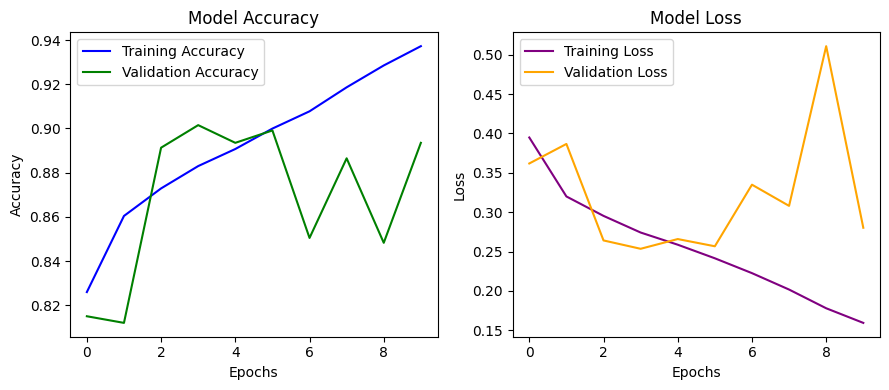

In [ ]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history3.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history3.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history3.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history3.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step


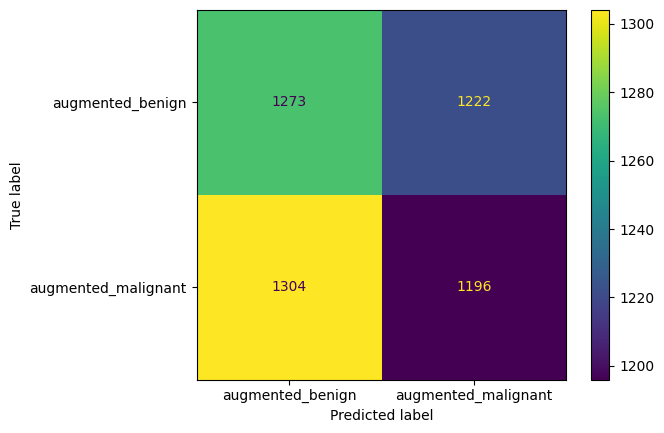

In [ ]:
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
y_true = test_generator.classes
y_pred = model3.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

**CNN Model for Original RGB Agumented Data**

In [ ]:
# Define paths to train and test directories
train_dir = '/content/melanoma_cancer_dataset/train_unique'
test_dir = '/content/melanoma_cancer_dataset/test_unique'

# Model parameters
img_height, img_width = 128, 128  # Resize images for uniform input
batch_size = 32
epochs = 10

In [ ]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant']  # Ensure binary classification
)

# Print accessed directories in train
print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant']  # Ensure binary classification
)

# Print accessed directories in test
print("Test Generator Class Indices: ", test_generator.class_indices)

Found 47895 images belonging to 2 classes.
Train Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}
Found 4995 images belonging to 2 classes.
Test Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}


In [ ]:
# Define model
model4 = Sequential([
    Input(shape=(img_height, img_width, 1)),  # Define input shape for grayscale images
    Conv2D(32, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification (sigmoid)
])
model4.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 126, 126, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,601 (12.61 MB)

 Trainable params: 3,304,897 (12.61 MB)

 Non-trainable params: 704 (2.75 KB)

In [ ]:
# Compile the model with a reduced learning rate
optimizer = Adam(learning_rate=0.0001)
model4.compile(
    loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy']
)
history4 = model4.fit(train_generator, epochs=epochs, validation_data=test_generator)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1497/1497 ━━━━━━━━━━━━━━━━━━━━ 100s 61ms/step - accuracy: 0.8065 - loss: 0.4364 - val_accuracy: 0.8787 - val_loss: 0.3101
Epoch 2/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 103s 39ms/step - accuracy: 0.8652 - loss: 0.3143 - val_accuracy: 0.8102 - val_loss: 0.4228
Epoch 3/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 61s 40ms/step - accuracy: 0.8712 - loss: 0.3000 - val_accuracy: 0.8993 - val_loss: 0.2433
Epoch 4/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - accuracy: 0.8766 - loss: 0.2836 - val_accuracy: 0.8657 - val_loss: 0.3337
Epoch 5/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 83s 40ms/step - accuracy: 0.8876 - loss: 0.2658 - val_accuracy: 0.8242 - val_loss: 0.4256
Epoch 6/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 81s 40ms/step - accuracy: 0.8956 - loss: 0.2531 - val_accuracy: 0.8332 - val_loss: 0.5415
Epoch 7/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 82s 40ms/step - accuracy: 0.9014 - loss: 0.2368 - val_accuracy: 0.8787 - val_loss: 0.2788
Epoch 8/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 87s 43ms/step - accuracy: 0.9125 - loss: 0.

In [ ]:
test_loss, test_accuracy = model4.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - accuracy: 0.8947 - loss: 0.2939
Test Loss: 0.2759891450405121
Test Accuracy: 0.9001001119613647


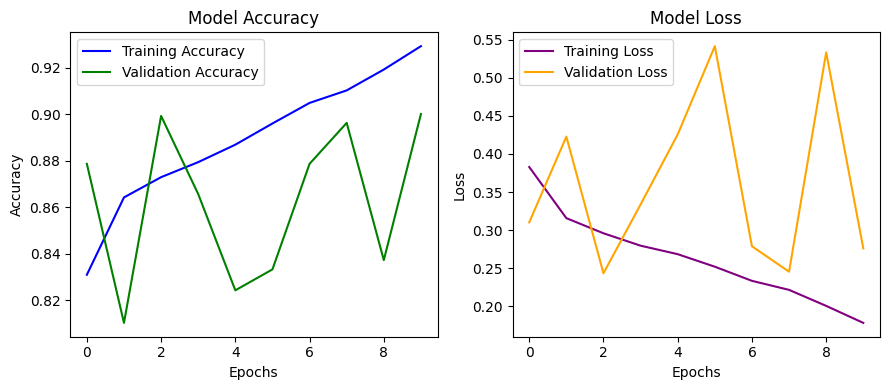

In [ ]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history4.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history4.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history4.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history4.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step


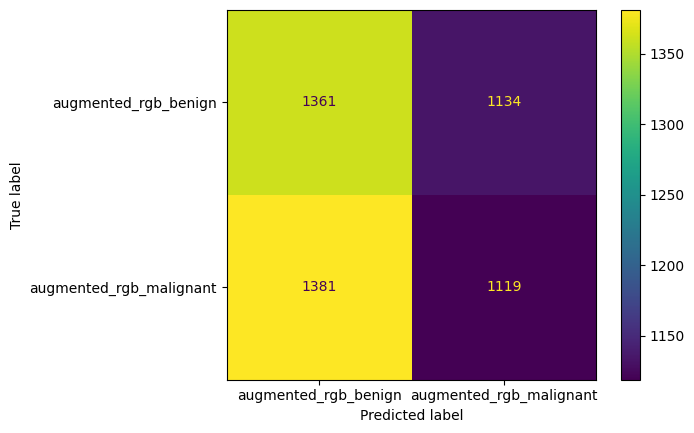

In [ ]:
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
y_true = test_generator.classes
y_pred = model4.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

##**PreTrained Transfer Learning Models**##

**VGG16 Model**

In [ ]:

from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam


# Define paths to train and test directories
train_dir = '/content/melanoma_cancer_dataset/train_unique'
test_dir = '/content/melanoma_cancer_dataset/test_unique'

# Model parameters
img_height, img_width = 128, 128  # Resize images for uniform input
batch_size = 32
epochs = 10

In [ ]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='rgb',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant']  # Ensure binary classification
)

# Print accessed directories in train
print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='rgb',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant']  # Ensure binary classification
)

# Print accessed directories in test
print("Test Generator Class Indices: ", test_generator.class_indices)

Found 47895 images belonging to 2 classes.
Train Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}
Found 4995 images belonging to 2 classes.
Test Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}


**Freeze the Base Layers**

In [ ]:

# Load pre-trained VGG16 model (excluding the top classification layer)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the layers in the base model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the VGG16 base model
model5 = Sequential([
    base_model,
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification
])

model5.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 4, 4, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       1,048,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,763,521 (60.13 MB)

 Trainable params: 1,048,833 (4.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

**Compile the Model**

In [ ]:
# Compile the model
optimizer = Adam(learning_rate=0.0001)  # Use Adam optimizer with a low learning rate
model5.compile(
    loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy']
)
# Train the model
history5 = model5.fit(train_generator, epochs=epochs, validation_data=test_generator)


Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1497/1497 ━━━━━━━━━━━━━━━━━━━━ 114s 69ms/step - accuracy: 0.8196 - loss: 0.3961 - val_accuracy: 0.8891 - val_loss: 0.2605
Epoch 2/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 115s 56ms/step - accuracy: 0.8833 - loss: 0.2762 - val_accuracy: 0.8979 - val_loss: 0.2454
Epoch 3/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 82s 55ms/step - accuracy: 0.8940 - loss: 0.2549 - val_accuracy: 0.8935 - val_loss: 0.2463
Epoch 4/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 85s 56ms/step - accuracy: 0.8966 - loss: 0.2458 - val_accuracy: 0.8975 - val_loss: 0.2454
Epoch 5/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 82s 55ms/step - accuracy: 0.9045 - loss: 0.2299 - val_accuracy: 0.8997 - val_loss: 0.2368
Epoch 6/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 81s 54ms/step - accuracy: 0.9066 - loss: 0.2271 - val_accuracy: 0.9027 - val_loss: 0.2347
Epoch 7/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 85s 56ms/step - accuracy: 0.9111 - loss: 0.2180 - val_accuracy: 0.8991 - val_loss: 0.2366
Epoch 8/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 142s 56ms/step - accuracy: 0.9140 - loss: 0

**Evaluate the Model**

In [ ]:
# Evaluate the model
test_loss, test_accuracy = model5.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step - accuracy: 0.9063 - loss: 0.2482
Test Loss: 0.25636839866638184
Test Accuracy: 0.9013013243675232


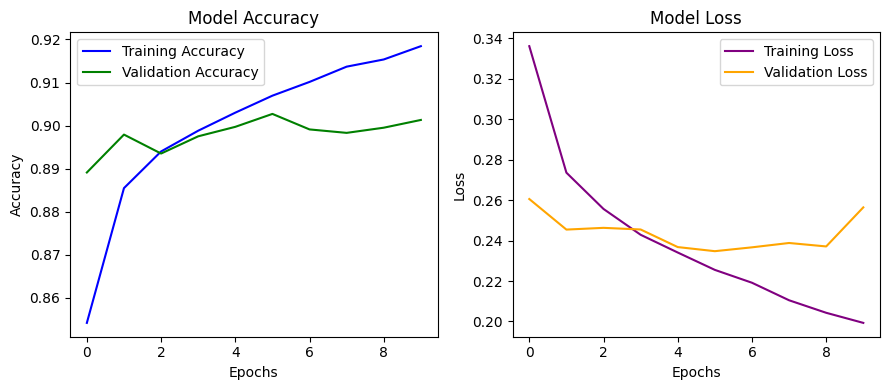

In [ ]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history5.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history5.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history5.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history5.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

**Visualization of Confusion Matrix**

157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step


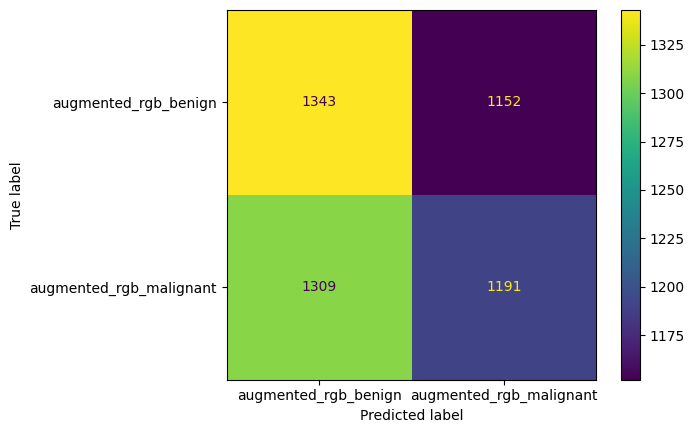

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.pyplot as plt
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
y_true = test_generator.classes
y_pred = model5.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

**VGG19 Model**

In [ ]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam


# Define paths to train and test directories
train_dir = '/content/melanoma_cancer_dataset/train_unique'
test_dir = '/content/melanoma_cancer_dataset/test_unique'

# Model parameters
img_height, img_width = 128, 128  # Resize images for uniform input
batch_size = 32
epochs = 10

In [ ]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='rgb',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant']  # Ensure binary classification
)

# Print accessed directories in train
print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='rgb',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant']  # Ensure binary classification
)

# Print accessed directories in test
print("Test Generator Class Indices: ", test_generator.class_indices)

Found 47895 images belonging to 2 classes.
Train Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}
Found 4995 images belonging to 2 classes.
Test Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}


**Freeze the Base Layers**

In [ ]:
# Load pre-trained VGG19 model (excluding the top classification layer)
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the layers in the base model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the VGG19 base model
model6 = Sequential([
    base_model,
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification
])

model6.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 4, 4, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       1,048,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,073,217 (80.39 MB)

 Trainable params: 1,048,833 (4.00 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [ ]:
# Compile the model
optimizer = Adam(learning_rate=0.0001)  # Use Adam optimizer with a low learning rate
model6.compile(
    loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy']
)
# Train the model
history6 = model6.fit(train_generator, epochs=epochs, validation_data=test_generator)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1497/1497 ━━━━━━━━━━━━━━━━━━━━ 104s 63ms/step - accuracy: 0.8111 - loss: 0.4052 - val_accuracy: 0.8907 - val_loss: 0.2659
Epoch 2/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 129s 60ms/step - accuracy: 0.8709 - loss: 0.2975 - val_accuracy: 0.8919 - val_loss: 0.2506
Epoch 3/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 143s 61ms/step - accuracy: 0.8813 - loss: 0.2764 - val_accuracy: 0.8949 - val_loss: 0.2564
Epoch 4/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 91s 61ms/step - accuracy: 0.8866 - loss: 0.2654 - val_accuracy: 0.8967 - val_loss: 0.2504
Epoch 5/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 89s 59ms/step - accuracy: 0.8913 - loss: 0.2601 - val_accuracy: 0.8907 - val_loss: 0.2425
Epoch 6/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 143s 60ms/step - accuracy: 0.8940 - loss: 0.2468 - val_accuracy: 0.9005 - val_loss: 0.2385
Epoch 7/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 90s 60ms/step - accuracy: 0.8939 - loss: 0.2486 - val_accuracy: 0.8943 - val_loss: 0.2403
Epoch 8/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 89s 59ms/step - accuracy: 0.8986 - loss: 

**Evaluation of Model**

In [ ]:
# Evaluate the model
test_loss, test_accuracy = model6.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8952 - loss: 0.2390
Test Loss: 0.2373916357755661
Test Accuracy: 0.8958958983421326


**Model Acuuracy and Model Loss**

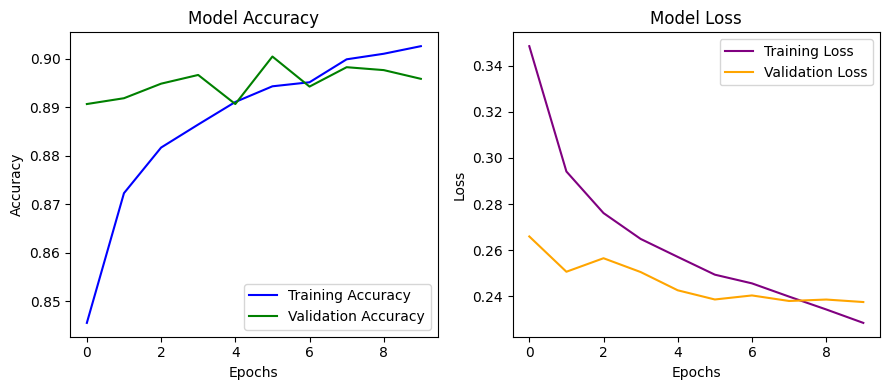

In [ ]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history6.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history6.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history6.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history6.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

**Visualization of Confusion Matrix**

157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step


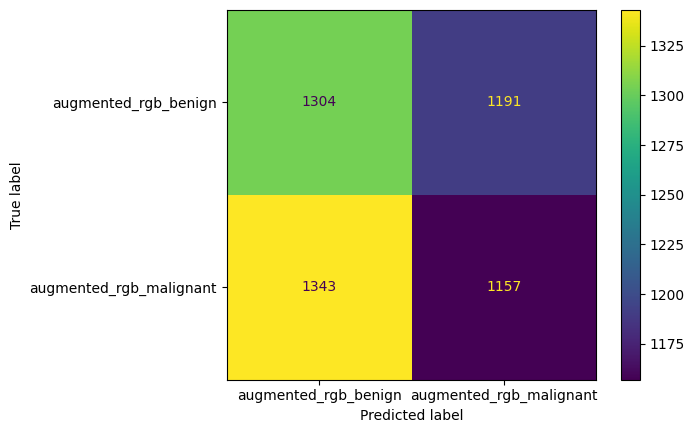

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.pyplot as plt
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
y_true = test_generator.classes
y_pred = model6.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

**Visualization of ROC Curve for VGG19 Model**

157/157 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step


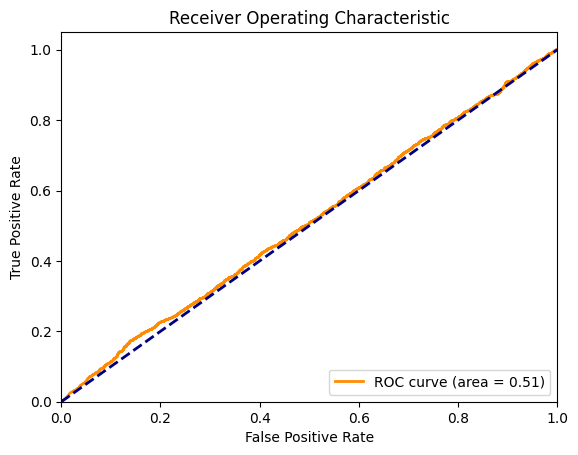

In [ ]:
# Assuming 'y_true' is the true labels and 'y_pred' are predicted probabilities
y_true = test_generator.classes
y_pred_prob = model6.predict(test_generator)

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

**Model Performance Summary**

In [ ]:
import pandas as pd
from IPython.display import display, HTML

# Data
data = {
    "Model Name": [
        "CNN Model on RGB Images",
        "CNN Model on Grayscaled Normalized Images",
        "CNN Model on Grayscaled Normalized Agumented Images",
        "CNN Model on RGB Agumented Images",
        "VGG-16 Model on RGB Agumented Images",
        "VGG-19 Model on RGB Agumented Images"
    ],
    "Test Accuracy (%)": ["88.29%", "89.38%", "87.77%", "90.01%", "90.49%", "89.58%"]
}
df = pd.DataFrame(data)

# Add Serial Number
df.insert(0, "Serial Number", range(1, len(df) + 1))


# Apply styling
styled_table = df.style.set_table_styles([
    {'selector': 'th', 'props': [('background-color', 'lightblue'), ('color', 'black'), ('font-weight', 'bold'), ('border', '2px solid black')]},
    {'selector': 'td', 'props': [('border', '2px solid black')]}
]).set_properties(**{'text-align': 'center'})

# Display the heading and table
display(HTML(f"<h2 style='text-align:left; color:darkblue;'>Model Performance Summary</h2>"))
display(HTML(styled_table.to_html()))


,Serial Number,Model Name,Test Accuracy (%)
0,1,CNN Model on RGB Images,88.29%
1,2,CNN Model on Grayscaled Normalized Images,89.38%
2,3,CNN Model on Grayscaled Normalized Agumented Images,87.77%
3,4,CNN Model on RGB Agumented Images,90.01%
4,5,VGG-16 Model on RGB Agumented Images,90.49%
5,6,VGG-19 Model on RGB Agumented Images,89.58%


**Model Accuracy and Model Loss for VGG16 Model**

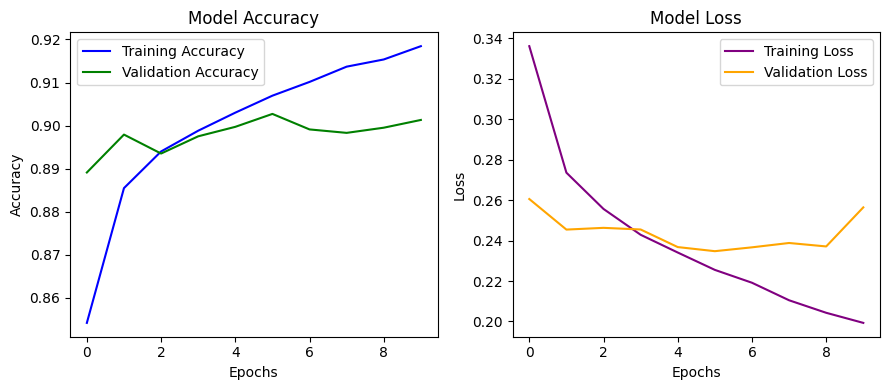

In [ ]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history5.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history5.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history5.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history5.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

**Confusion Matrix for VGG16 Model**

157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step


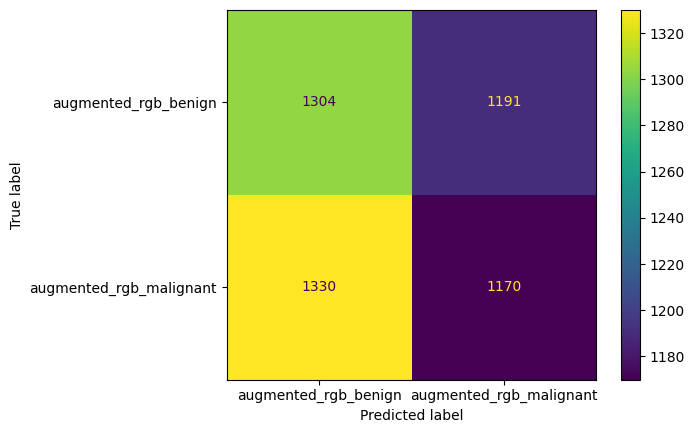

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.pyplot as plt
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
y_true = test_generator.classes
y_pred = model5.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

**Saving VGG16 Model**

In [ ]:
model5.save('model5.keras')

**Downloading VGG16 Model**

In [ ]:
from google.colab import files
files.download('model5.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##**Conclusion**

**Optimal Model Selection: VGG16 Outperforms Alternatives in Image Classification Accuracy**

After evaluating various models, including CNN models on RGB images, grayscaled normalized images, and augmented image data, as well as the VGG-16 and VGG-19 models, it is clear that the VGG16 model provides the highest accuracy for our image classification task. Specifically, VGG16 achieved superior performance with an accuracy of 90.49%, outperforming other models such as CNN and VGG-19, which had accuracies of 89.58% and 89.52%, respectively.

The VGG16 model's architecture, which leverages a deep convolutional network with a consistent use of small filters, allows it to capture complex hierarchical features, making it particularly effective for image classification tasks. Additionally, the availability of pretrained weights from ImageNet and its ability to generalize well to unseen data further contributes to its high performance.



##**THANK YOU**##
